In [1]:
import os
import glob
from astropy.table import Table, vstack
import pandas as pd
import lightgbm as lgb
from astropy.io import fits

In [2]:
import matplotlib.pyplot as plt
import matplotlib as mpl
#
mpl.rcParams["axes.titlesize"] = 14
mpl.rcParams["axes.labelsize"] = 20
plt.rcParams['savefig.dpi'] = 500
plt.rc('font', family='serif')

In [59]:
from astropy.io import fits
from astropy.visualization import ZScaleInterval
import matplotlib.pyplot as plt

def visualize_fits_region(x, y, image_name, size=50, xlabel=True, ylabel=True, title=True):
    """
    주어진 x, y 좌표를 중심으로 FITS 이미지에서 size×size 영역을 추출하고,
    ZScaleInterval을 이용해 시각화하는 함수입니다.
    
    Parameters:
    - x, y: 이미지의 중심 좌표 (픽셀 단위)
    - image_name: FITS 이미지 파일 이름 (또는 경로)
    - size: 추출할 영역의 크기 (기본값: 50)
    """
    # 1. FITS 파일 읽기
    with fits.open(image_name) as hdul:
        data = hdul[0].data  # 주 이미지가 첫번째 HDU에 있다고 가정

    # 2. 좌표를 정수로 변환 (픽셀 인덱스)
    x = int(x)
    y = int(y)
    half_size = size // 2

    # 3. 잘라낼 영역의 인덱스 계산 (경계값 체크 포함)
    x_min = max(x - half_size, 0)
    x_max = min(x + half_size, data.shape[1])
    y_min = max(y - half_size, 0)
    y_max = min(y + half_size, data.shape[0])

    # 4. 2D array (cutout) 추출: FITS 이미지는 보통 (y, x) 순서임에 주의!
    cutout = data[y_min:y_max, x_min:x_max]

    # 5. ZScale 알고리즘으로 색상 범위 결정하기
    zscale = ZScaleInterval()
    vmin, vmax = zscale.get_limits(cutout)

    # 6. 시각화
    # plt.figure(figsize=(6, 6))
    plt.imshow(cutout, origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    # plt.colorbar(label='Intensity')
    # plt.title(f"{os.path.basename(image)} (x={x}, y={y})")
    if title: plt.title(f"x={x}, y={y}")
    if xlabel: plt.xlabel("X [Pixel]")
    if ylabel: plt.ylabel("Y [Pixel]")
    # plt.show()

# 예시 사용:
# visualize_fits_region(100, 150, 'example.fits', size=50)

In [4]:
path_proc = "/lyman/data1/processed_1x1_gain2750"

In [5]:
# 3, 5, 10
# MAG_APER_3 : 3"
# MAG_APER_4 : 5"
# MAG_APER_5 : 10"

magkey3 = "MAG_APER_3"
magkey4 = "MAG_APER_4"
magkey5 = "MAG_APER_5"

dmagkey5_4 = "D_MAG_APER_5-4"
dmagkey5_3 = "D_MAG_APER_5-3"
dmagkey4_3 = "D_MAG_APER_4-3"

In [6]:
keys_to_keep = ["image", "X_IMAGE", "Y_IMAGE", "r_seeing", "r_elong", "r_ellip", dmagkey5_4, dmagkey5_3, dmagkey4_3]
keys_to_train = ["r_seeing", "r_elong", "r_ellip", dmagkey5_4, dmagkey5_3, dmagkey4_3, 'label']

In [7]:
tiles = [
	"T00138",
	"T00139",
	"T00174",
	"T00175",
	"T00176",
	"T00215",
	"T00216",
	]

In [8]:
n_limit_real_images = 3000
n_limit_bogus_images = 6000

In [9]:
catalogs_to_exclude = [
	"/lyman/data1/processed_1x1_gain2750/T00138/7DT07/m675/calib_7DT07_T00138_20241108_004847_m675_300.com.fits /lyman/data1/processed_1x1_gain2750/T00138/7DT07/m675/calib_7DT07_T00138_20241108_004847_m675_300.com.subt.cat",
	"/lyman/data1/processed_1x1_gain2750/T00138/7DT07/m650/calib_7DT07_T00138_20241108_004319_m675_300.com.fits /lyman/data1/processed_1x1_gain2750/T00138/7DT07/m675/calib_7DT07_T00138_20241108_004319_m650_300.com.subt.cat",
	"/lyman/data1/processed_1x1_gain2750/T00138/7DT07/m650/calib_7DT07_T00138_20241108_004319_m675_300.com.fits /lyman/data1/processed_1x1_gain2750/T00138/7DT07/m675/calib_7DT07_T00138_20241109_005805_m650_200.com.subt.cat",
]

In [10]:
bogus_catalogs = []
for tile in tiles:
	tile_catalogs = glob.glob(f"{path_proc}/{tile}/7DT??/*/calib*com.subt.cat")
	bogus_catalogs += tile_catalogs

for excat in catalogs_to_exclude:
	if excat in bogus_catalogs:
		bogus_catalogs.remove(excat)
bogus_catalogs = sorted(bogus_catalogs)

print(f"{len(bogus_catalogs)} catalogs for bogus found")

7444 catalogs for bogus found


In [11]:
real_catalogs = []
for tile in tiles:
	real_catalogs += glob.glob(f"{path_proc}/{tile}/7DT??/*/phot/calib*com.phot.cat")
real_catalogs = sorted(real_catalogs)

print(f"{len(real_catalogs)} catalogs for real found")

16487 catalogs for real found


In [12]:
rcats = []

ii = 0
incat = real_catalogs[0]

for ii, incat in enumerate(real_catalogs):
	image = incat.replace("phot/", "").replace(".phot.cat", ".fits")
	if os.path.exists(image):
		#	Header
		hdr = fits.getheader(image)
		seeing, elong, ellip = hdr['SEEING'], hdr['ELONG'], hdr['ELLIP']
		intbl = Table.read(incat, format='ascii')

		intbl["image"] = image

		#	New Metrics
		intbl['r_seeing'] = intbl['FWHM_WORLD'] * 3600 / seeing
		intbl['r_elong'] = intbl['ELONGATION'] / elong
		intbl['r_ellip'] = intbl['ELLIPTICITY'] / ellip

		intbl[dmagkey5_4] = intbl[magkey5] - intbl[magkey4]
		intbl[dmagkey5_3] = intbl[magkey5] - intbl[magkey3]
		intbl[dmagkey4_3] = intbl[magkey4] - intbl[magkey3]

		indx_filter = (~intbl['source_id'].mask) & (intbl['FLAGS']==0)

		subtbl = intbl[keys_to_keep][indx_filter]

		print(f"[{ii}] {os.path.basename(image)} ({len(intbl)} --> {len(subtbl)})")
		rcats.append(subtbl)
	if ii == n_limit_real_images: break

real_table = vstack(rcats)
# real_table['label'] = 'real'
real_table['label'] = 1

[0] calib_7DT02_T00138_20240903_083215_m450_300.com.fits (2688 --> 2135)
[1] calib_7DT02_T00138_20241029_073610_m450_300.com.fits (2788 --> 2169)
[2] calib_7DT02_T00138_20241030_012012_m450_300.com.fits (3235 --> 2258)
[3] calib_7DT02_T00138_20241031_003505_m450_300.com.fits (5036 --> 2287)
[4] calib_7DT02_T00138_20241102_043607_m450_300.com.fits (2848 --> 2212)
[5] calib_7DT02_T00138_20241103_011247_m450_300.com.fits (3010 --> 2249)
[6] calib_7DT02_T00138_20241104_035837_m450_300.com.fits (3129 --> 2263)
[7] calib_7DT02_T00138_20241105_010323_m450_300.com.fits (3101 --> 2279)
[8] calib_7DT02_T00138_20241106_010748_m450_300.com.fits (3002 --> 2276)
[9] calib_7DT02_T00138_20241107_004223_m450_300.com.fits (2303 --> 2013)
[10] calib_7DT02_T00138_20241109_005804_m450_200.com.fits (18153 --> 2)
[11] calib_7DT02_T00138_20241110_030110_m450_300.com.fits (2055 --> 1843)
[12] calib_7DT02_T00138_20241111_004629_m450_300.com.fits (1937 --> 1743)
[13] calib_7DT02_T00138_20241112_004733_m450_300.c

In [13]:
bcats = []

ii = 0
incat = bogus_catalogs[0]

for ii, incat in enumerate(bogus_catalogs):
	image = incat.replace(".cat", ".fits")
	if os.path.exists(image):
		#	Header
		hdr = fits.getheader(image)
		seeing, elong, ellip = hdr['SEEING'], hdr['ELONG'], hdr['ELLIP']
		intbl = Table.read(incat, format='ascii')

		intbl["image"] = image

		#	New Metrics
		intbl['r_seeing'] = intbl['FWHM_WORLD'] * 3600 / seeing
		intbl['r_elong'] = intbl['ELONGATION'] / elong
		intbl['r_ellip'] = intbl['ELLIPTICITY'] / ellip

		intbl[dmagkey5_4] = intbl[magkey5] - intbl[magkey4]
		intbl[dmagkey5_3] = intbl[magkey5] - intbl[magkey3]
		intbl[dmagkey4_3] = intbl[magkey4] - intbl[magkey3]

		subtbl = intbl[keys_to_keep]

		print(f"[{ii}] {os.path.basename(image)} ({len(intbl)} --> {len(subtbl)})")

		bcats.append(subtbl)
	if ii == n_limit_bogus_images: break

bogus_table = vstack(bcats)
# bogus_table['label'] = 'bogus'
bogus_table['label'] = 0

[0] calib_7DT02_T00138_20240903_083215_m450_300.com.subt.fits (584 --> 584)
[1] calib_7DT02_T00138_20241029_073610_m450_300.com.subt.fits (599 --> 599)
[2] calib_7DT02_T00138_20241030_012012_m450_300.com.subt.fits (977 --> 977)
[3] calib_7DT02_T00138_20241031_003505_m450_300.com.subt.fits (2546 --> 2546)
[4] calib_7DT02_T00138_20241102_043607_m450_300.com.subt.fits (601 --> 601)
[5] calib_7DT02_T00138_20241103_011247_m450_300.com.subt.fits (642 --> 642)
[6] calib_7DT02_T00138_20241104_035837_m450_300.com.subt.fits (770 --> 770)
[7] calib_7DT02_T00138_20241105_010323_m450_300.com.subt.fits (750 --> 750)
[8] calib_7DT02_T00138_20241106_010748_m450_300.com.subt.fits (733 --> 733)
[9] calib_7DT02_T00138_20241107_004223_m450_300.com.subt.fits (452 --> 452)
[10] calib_7DT02_T00138_20241109_005804_m450_200.com.subt.fits (11443 --> 11443)
[11] calib_7DT02_T00138_20241110_030110_m450_300.com.subt.fits (252 --> 252)
[12] calib_7DT02_T00138_20241111_004629_m450_300.com.subt.fits (203 --> 203)
[13

In [14]:
tcats = [] # target

ii = 0
incat = bogus_catalogs[0]

for ii, incat in enumerate(bogus_catalogs[n_limit_bogus_images:]):
	image = incat.replace(".cat", ".fits")
	if os.path.exists(image):
		#	Header
		hdr = fits.getheader(image)
		seeing, elong, ellip = hdr['SEEING'], hdr['ELONG'], hdr['ELLIP']
		intbl = Table.read(incat, format='ascii')

		intbl["image"] = image

		#	New Metrics
		intbl['r_seeing'] = intbl['FWHM_WORLD'] * 3600 / seeing
		intbl['r_elong'] = intbl['ELONGATION'] / elong
		intbl['r_ellip'] = intbl['ELLIPTICITY'] / ellip

		intbl[dmagkey5_4] = intbl[magkey5] - intbl[magkey4]
		intbl[dmagkey5_3] = intbl[magkey5] - intbl[magkey3]
		intbl[dmagkey4_3] = intbl[magkey4] - intbl[magkey3]

		indx_filter = intbl['FLAGS']==0
		subtbl = intbl[keys_to_keep][indx_filter]

		print(f"[{ii}] {os.path.basename(image)} ({len(intbl)} --> {len(subtbl)})")

		tcats.append(subtbl)
	if ii == n_limit_bogus_images: break

target_table = vstack(tcats)
# bogus_table['label'] = 'bogus'
# bogus_table['label'] = 0

[0] calib_7DT04_T00215_20241212_033727_m825_300.com.subt.fits (1134 --> 556)
[1] calib_7DT04_T00215_20241214_015442_m825_300.com.subt.fits (850 --> 476)
[2] calib_7DT04_T00215_20241217_014433_m825_300.com.subt.fits (935 --> 488)
[3] calib_7DT04_T00215_20241218_041735_m825_300.com.subt.fits (928 --> 467)
[4] calib_7DT04_T00215_20241219_014522_m825_300.com.subt.fits (727 --> 400)
[5] calib_7DT04_T00215_20241220_013409_m825_300.com.subt.fits (693 --> 407)
[6] calib_7DT04_T00215_20241221_013440_m825_300.com.subt.fits (878 --> 499)
[7] calib_7DT04_T00215_20241222_021521_m825_300.com.subt.fits (6740 --> 2255)
[8] calib_7DT05_T00215_20240907_082239_m550_300.com.subt.fits (480 --> 249)
[9] calib_7DT05_T00215_20241029_074735_m550_300.com.subt.fits (1040 --> 495)
[10] calib_7DT05_T00215_20241030_013138_m550_300.com.subt.fits (1328 --> 782)
[11] calib_7DT05_T00215_20241031_004631_m550_300.com.subt.fits (1377 --> 677)
[12] calib_7DT05_T00215_20241101_013711_m550_300.com.subt.fits (1020 --> 582)
[1

In [15]:
table = vstack([real_table, bogus_table])[keys_to_train]

print(f"{len(table)} rows compiled (real, 1: {len(real_table)}, bogus, 0: {len(bogus_table)})")

17199927 rows compiled (real, 1: 5953392, bogus, 0: 11246535)


In [16]:
# 3. 그룹1과 그룹2 데이터를 병합하여 전체 학습 데이터 구성
df_all = table.to_pandas()

In [17]:
# 4. feature와 label 분리 (모든 컬럼을 feature로 사용)
X = df_all.drop(columns=['label'])
y = df_all['label']


In [18]:
# 5. LightGBM용 Dataset 생성 및 분류 모델 학습
lgb_train = lgb.Dataset(X, label=y)

params = {
    'objective': 'binary',      # 이진 분류
    'metric': 'binary_logloss', # 평가 지표 (필요에 따라 다른 metric 사용 가능)
    'verbose': -1
}

num_round = 100  # 학습 반복 횟수 (필요에 따라 조정)
model = lgb.train(params, lgb_train, num_round)

# 모델 학습 후, 예측이나 저장 등의 추가 작업을 진행할 수 있습니다.
print("LightGBM 모델 학습이 완료되었습니다.")

LightGBM 모델 학습이 완료되었습니다.


In [24]:
# threshold = 0.95
threshold = 0.99
# threshold = 1.0


X_target = target_table.to_pandas().drop(columns=['image', 'X_IMAGE', 'Y_IMAGE'])

# model 변수에 학습된 LightGBM 모델이 저장되어 있다고 가정합니다.
predictions = model.predict(X_target)

# 3. 예측 결과를 이진 분류 라벨로 변환하기 (0.5 임계치 기준)
predicted_labels = (predictions >= threshold).astype(int)
indx_real_cand = predicted_labels == 1

# 4. 결과 출력
# print("예측 확률:", predictions)
# print("예측 라벨:", predicted_labels)


print(f"Threshold: {threshold}")
print(f"{len(predicted_labels[indx_real_cand])} candidates classified as 'real' among {len(predictions)} sources")

Threshold: 0.99
4478 candidates classified as 'real' among 1281885 sources


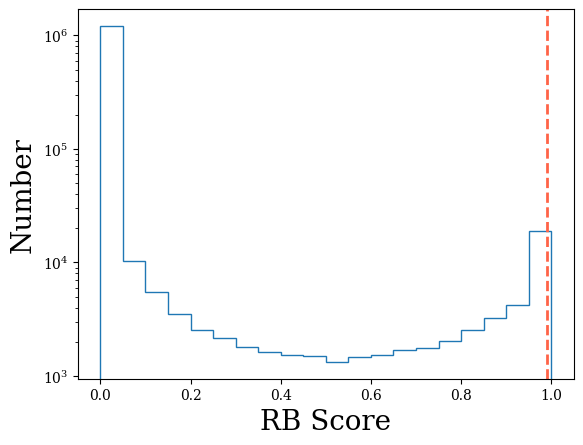

In [25]:
import numpy as np
_ = plt.hist(predictions, bins=np.arange(0, 1.0+0.05, 0.05), histtype='step', lw=3)
plt.axvline(x=threshold, ls='--', c='tomato', lw=2)
plt.xlabel("RB Score")
plt.ylabel("Number")
plt.yscale('log')

In [ ]:
path_save = '.'

cand_table = target_table[indx_real_cand]

311 found


image,X_IMAGE,Y_IMAGE,r_seeing,r_elong,r_ellip,D_MAG_APER_5-4,D_MAG_APER_5-3,D_MAG_APER_4-3
,pix,pix,deg,,,mag,mag,mag
str111,float64,float64,float64,float64,float64,float64,float64,float64
/lyman/data1/processed_1x1_gain2750/T00215/7DT04/m825/calib_7DT04_T00215_20241217_014433_m825_300.com.subt.fits,9604.6299,4613.3726,0.9197060684769777,0.9196911196911198,0.706140350877193,-0.36019999999999985,-0.8748999999999998,-0.5146999999999999
/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241101_013711_m550_300.com.subt.fits,6670.6187,1227.5092,0.9350277720207253,0.9569798068481125,0.6721311475409837,-0.33150000000000013,-0.9762,-0.6446999999999998
/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241130_013535_m550_300.com.subt.fits,6670.6348,1227.2531,0.9684497280593324,1.0537363560033584,1.2608695652173914,-0.09229999999999983,-0.42959999999999976,-0.33729999999999993
/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241205_054531_m550_300.com.subt.fits,4846.1812,3619.4927,0.8451084243369734,1.0181660899653981,1.111111111111111,-0.41050000000000075,-1.1285000000000007,-0.718
/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241205_054531_m550_300.com.subt.fits,4603.6328,4811.7637,1.023100624024961,1.0294117647058825,1.1851851851851851,-0.4001000000000001,-1.1313999999999993,-0.7312999999999992
/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241210_014457_m550_300.com.subt.fits,8690.4639,2981.6462,1.052018181818182,1.065185185185185,1.1776061776061775,-0.15890000000000004,-0.3557000000000001,-0.19680000000000009
/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241126_013654_m575_300.com.subt.fits,7025.041,1881.5393,1.0127029090909092,0.9637488947833777,0.7155172413793104,-0.3828999999999998,-0.9051999999999998,-0.5223
/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241130_014104_m575_300.com.subt.fits,489.8265,6267.064,1.048986161960906,1.0980052038161319,1.5789473684210524,-0.17399999999999993,-0.6154999999999999,-0.4415


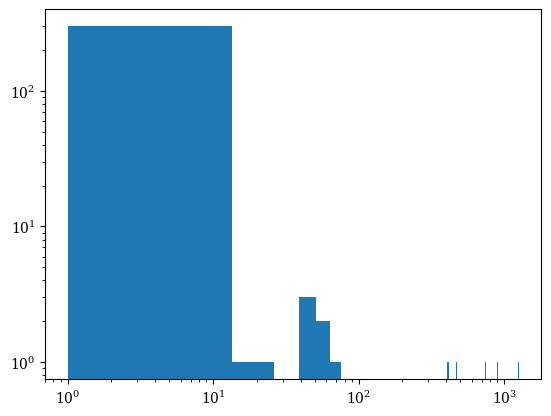

In [39]:
unique_images = np.unique(cand_table['image'].data)
print(f'{len(unique_images)} found')

n_sources = np.array([(cand_table['image'] == image).sum() for image in unique_images])

_ = plt.hist(n_sources, bins=100)
plt.yscale("log")
plt.xscale("log")

significant_table = cand_table[[img in unique_images[n_sources<30] for img in cand_table['image']]]
significant_table

In [43]:
path_ref = "/lyman/data1/factory/ref_frame"

/tmp/ipykernel_2032921/1273562929.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(18, 6))


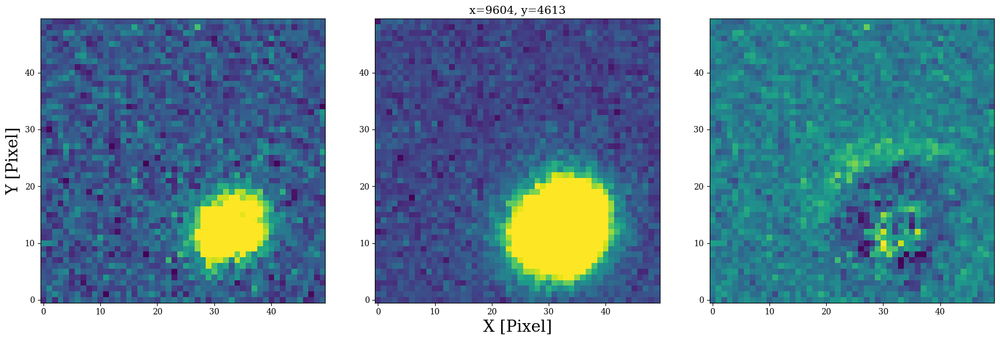

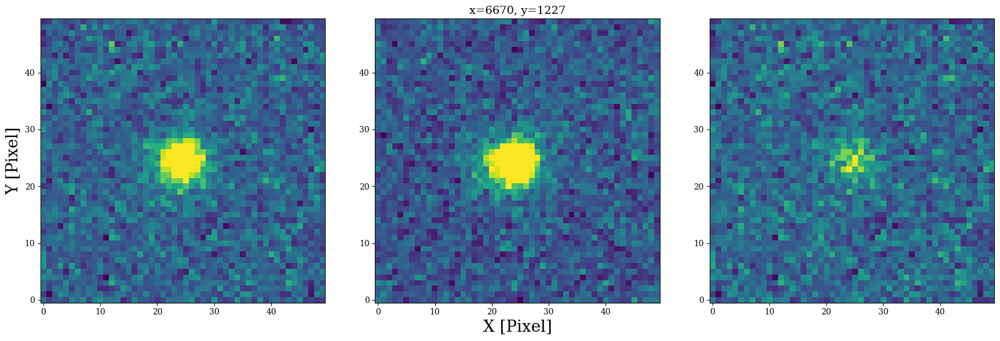

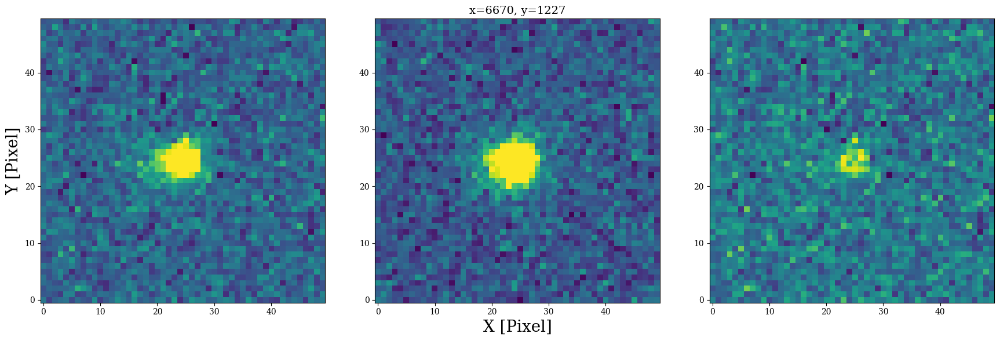

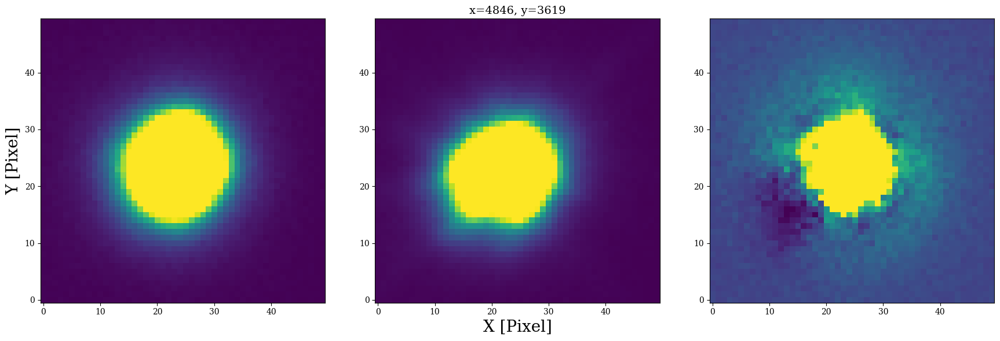

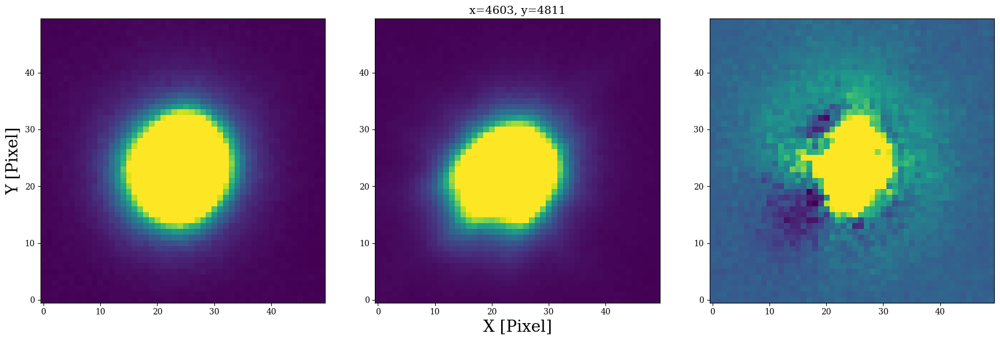

...

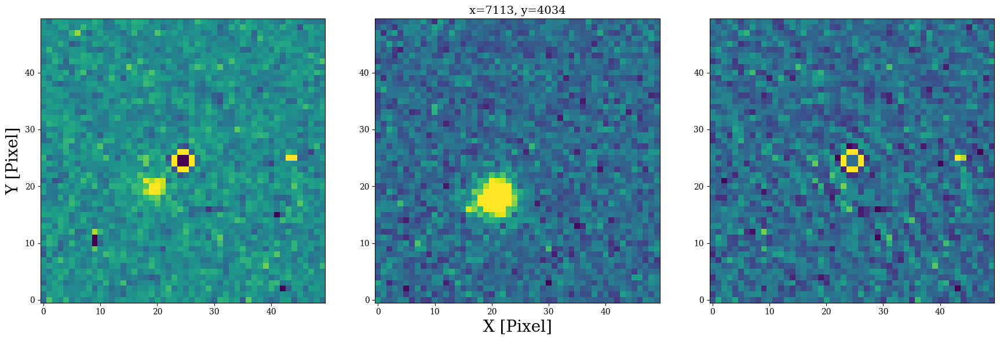

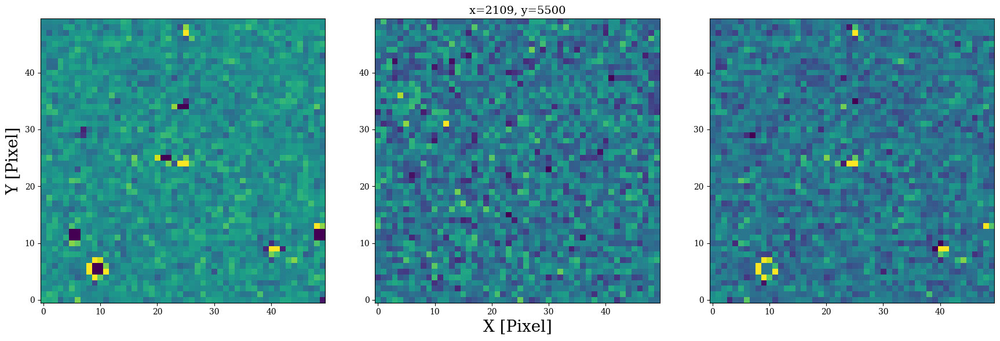

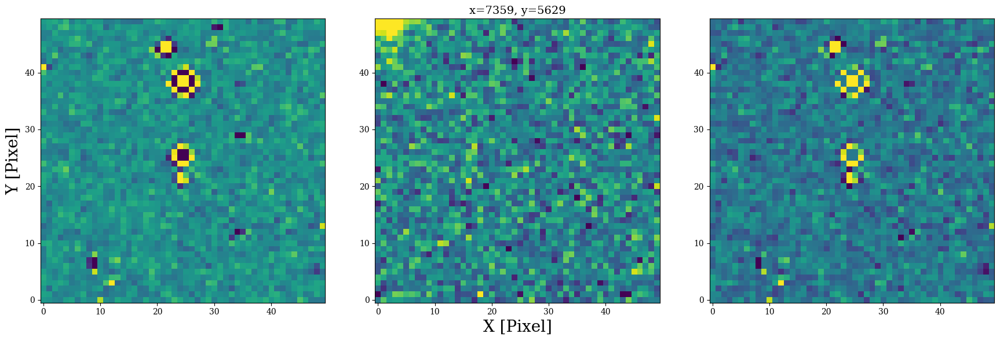

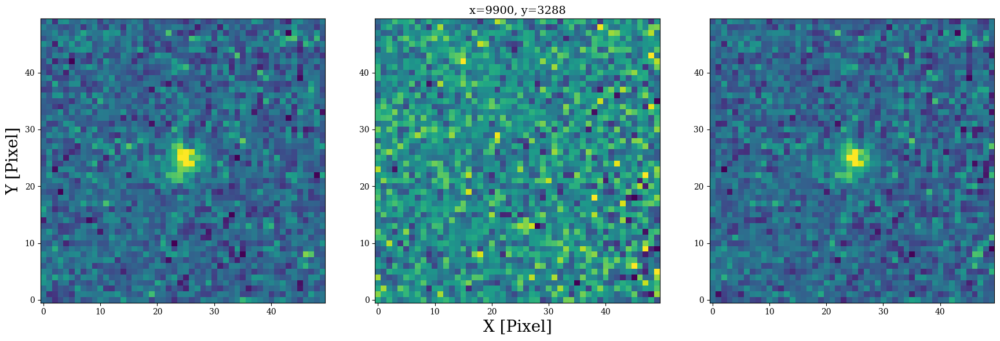

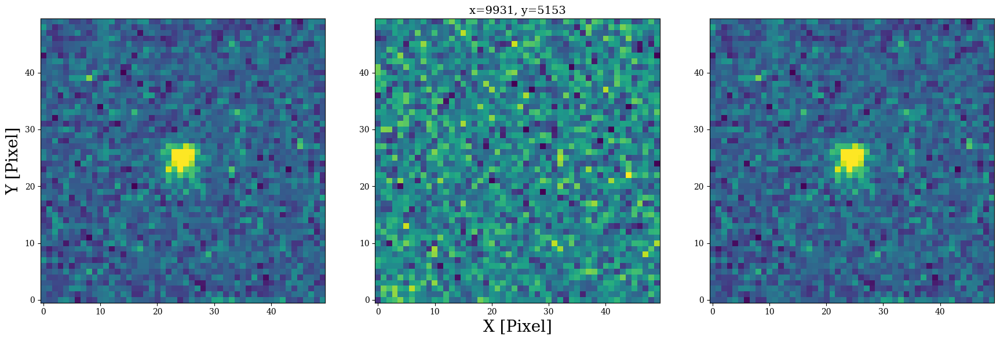

In [66]:
for nn, (image, x, y) in enumerate(zip(significant_table['image'], significant_table['X_IMAGE'], significant_table['Y_IMAGE'])):
    sci_image = image.replace(".subt", "")
    part = os.path.basename(image).split("_")
    filte, obj = part[-2], part[2]
    ref_image = glob.glob(f"{path_ref}/{filte}/ref_7DT_{obj}_*_{filte}_*.com.fits")[0]
    os.path.exists(ref_image)

    #   Figure
    plt.figure(figsize=(18, 6))

    for mm, image_name in enumerate([sci_image, ref_image, image]):
        plt.subplot(1, 3, mm+1)
        if mm == 0:
            ylabel = True
            xlabel = False
            title = False
        elif mm == 1:
            ylabel = False
            xlabel = True
            title = True
        elif mm == 2:
            ylabel = False
            xlabel = False
            title = False

        visualize_fits_region(x, y, image_name, size=50, xlabel=xlabel, ylabel=ylabel, title=title)
        plt.tight_layout()

    if nn == 100: break


In [67]:
ds9com = f"""ds9 {sci_image} \
    {image} \
    -tile yes \
    -pan to {x} {y} physical \
    -frame new \
    -pan to {x} {y} physical &"""
print(ds9com)

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241212_014632_m850_300.com.fits     /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241212_014632_m850_300.com.subt.fits     -tile yes     -pan to 9931.2773 5153.7432 physical     -frame new     -pan to 9931.2773 5153.7432 physical &


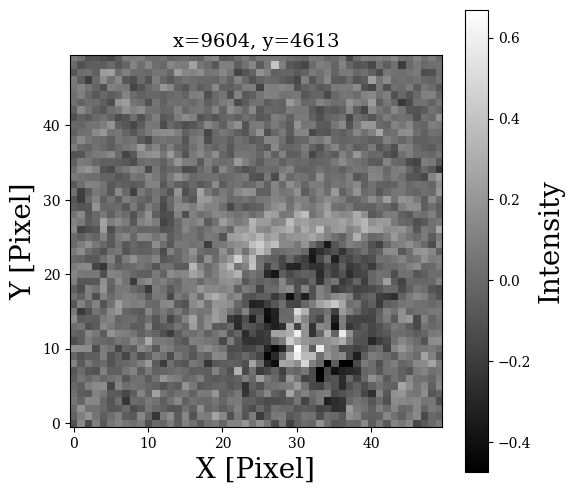

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT04/m825/calib_7DT04_T00215_20241217_014433_m825_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT04/m825/calib_7DT04_T00215_20241217_014433_m825_300.com.subt.fits 		-tile yes 		-pan to 9604.6299 4613.3726 physical 		-frame new 		-pan to 9604.6299 4613.3726 physical &


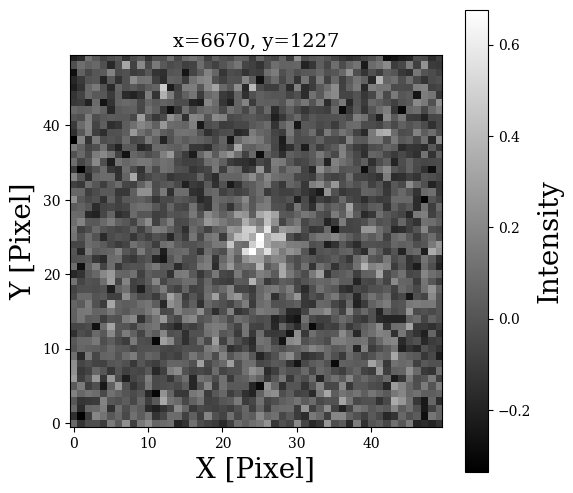

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241101_013711_m550_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241101_013711_m550_300.com.subt.fits 		-tile yes 		-pan to 6670.6187 1227.5092 physical 		-frame new 		-pan to 6670.6187 1227.5092 physical &


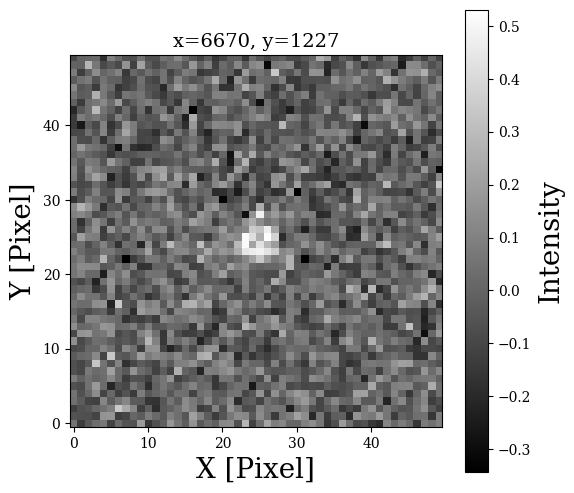

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241130_013535_m550_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241130_013535_m550_300.com.subt.fits 		-tile yes 		-pan to 6670.6348 1227.2531 physical 		-frame new 		-pan to 6670.6348 1227.2531 physical &


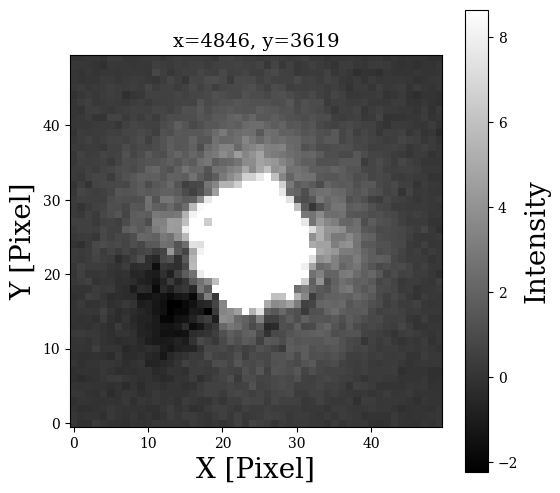

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241205_054531_m550_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241205_054531_m550_300.com.subt.fits 		-tile yes 		-pan to 4846.1812 3619.4927 physical 		-frame new 		-pan to 4846.1812 3619.4927 physical &


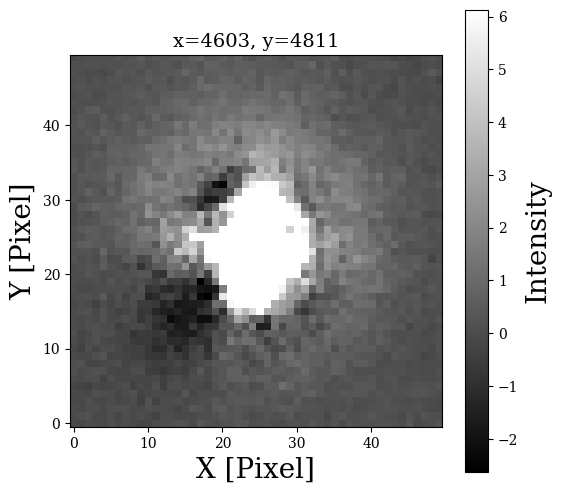

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241205_054531_m550_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241205_054531_m550_300.com.subt.fits 		-tile yes 		-pan to 4603.6328 4811.7637 physical 		-frame new 		-pan to 4603.6328 4811.7637 physical &


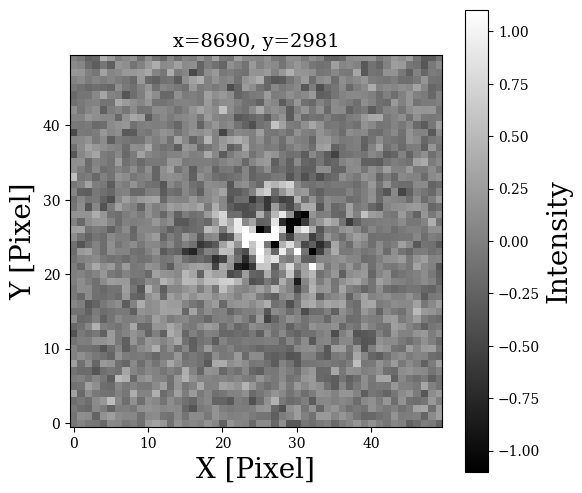

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241210_014457_m550_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m550/calib_7DT05_T00215_20241210_014457_m550_300.com.subt.fits 		-tile yes 		-pan to 8690.4639 2981.6462 physical 		-frame new 		-pan to 8690.4639 2981.6462 physical &


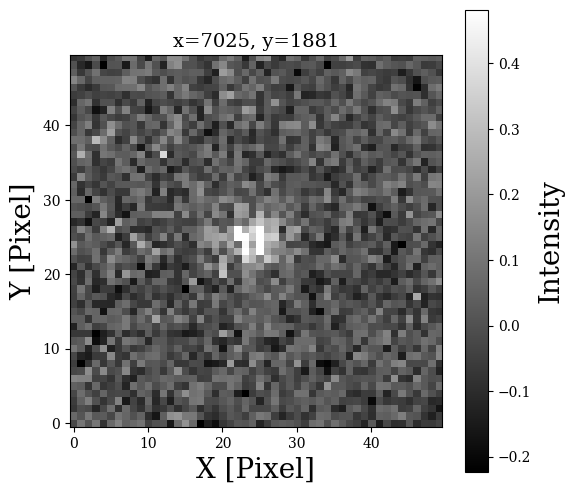

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241126_013654_m575_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241126_013654_m575_300.com.subt.fits 		-tile yes 		-pan to 7025.041 1881.5393 physical 		-frame new 		-pan to 7025.041 1881.5393 physical &


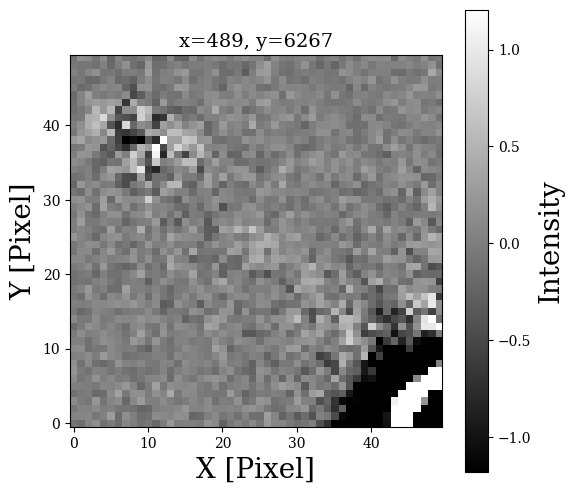

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241130_014104_m575_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241130_014104_m575_300.com.subt.fits 		-tile yes 		-pan to 489.8265 6267.064 physical 		-frame new 		-pan to 489.8265 6267.064 physical &


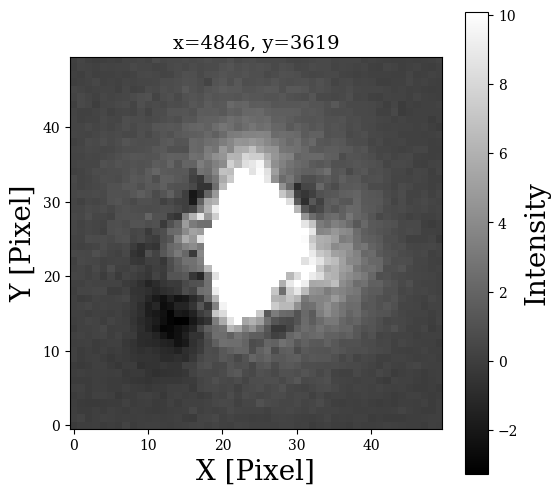

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241205_055238_m575_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241205_055238_m575_300.com.subt.fits 		-tile yes 		-pan to 4846.394 3619.9553 physical 		-frame new 		-pan to 4846.394 3619.9553 physical &


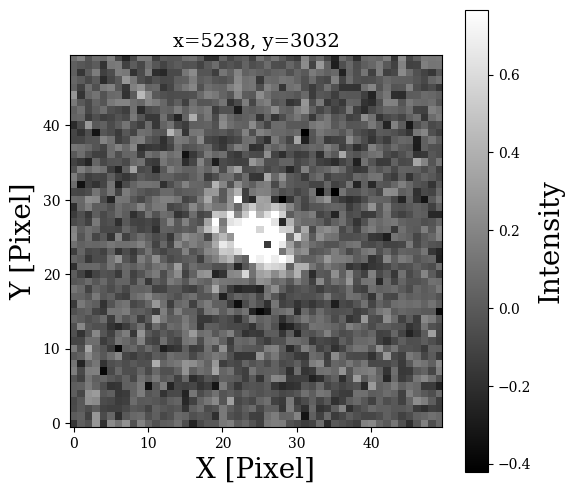

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241209_022410_m575_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241209_022410_m575_300.com.subt.fits 		-tile yes 		-pan to 5238.4521 3032.948 physical 		-frame new 		-pan to 5238.4521 3032.948 physical &


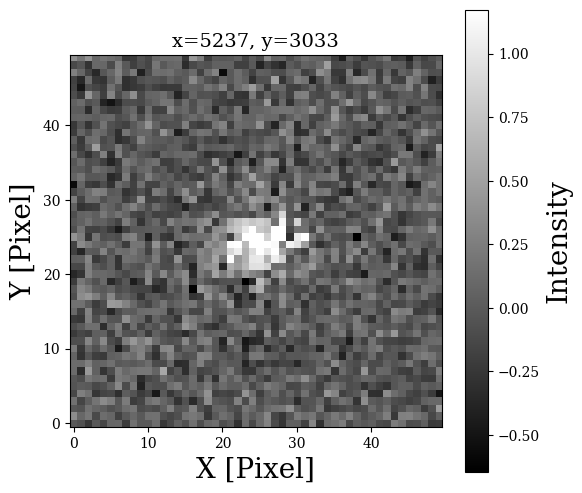

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241212_015204_m575_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241212_015204_m575_300.com.subt.fits 		-tile yes 		-pan to 5237.9229 3033.1528 physical 		-frame new 		-pan to 5237.9229 3033.1528 physical &


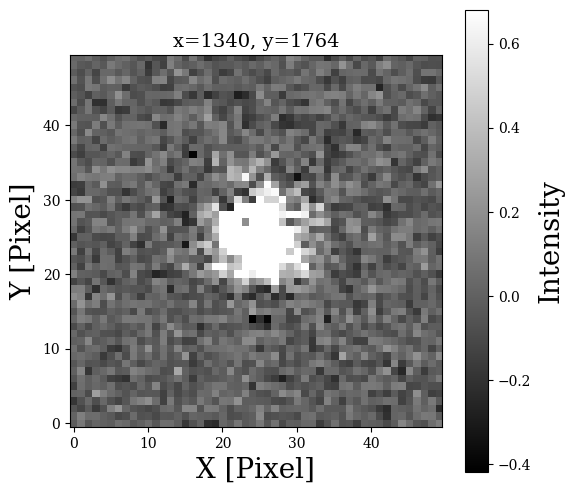

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241219_014523_m575_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT05/m575/calib_7DT05_T00215_20241219_014523_m575_300.com.subt.fits 		-tile yes 		-pan to 1340.9268 1764.8933 physical 		-frame new 		-pan to 1340.9268 1764.8933 physical &


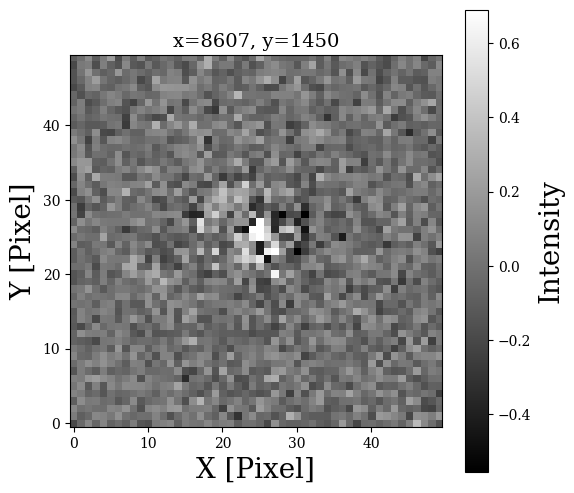

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT06/m600/calib_7DT06_T00215_20240907_082251_m600_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT06/m600/calib_7DT06_T00215_20240907_082251_m600_300.com.subt.fits 		-tile yes 		-pan to 8607.9688 1450.9202 physical 		-frame new 		-pan to 8607.9688 1450.9202 physical &


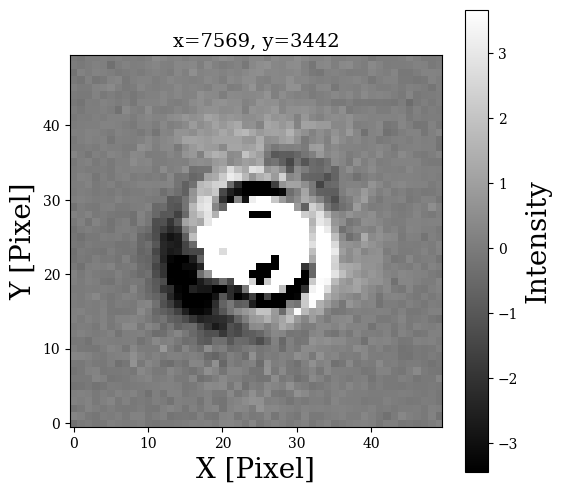

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20240907_082240_m650_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20240907_082240_m650_300.com.subt.fits 		-tile yes 		-pan to 7569.6479 3442.7046 physical 		-frame new 		-pan to 7569.6479 3442.7046 physical &


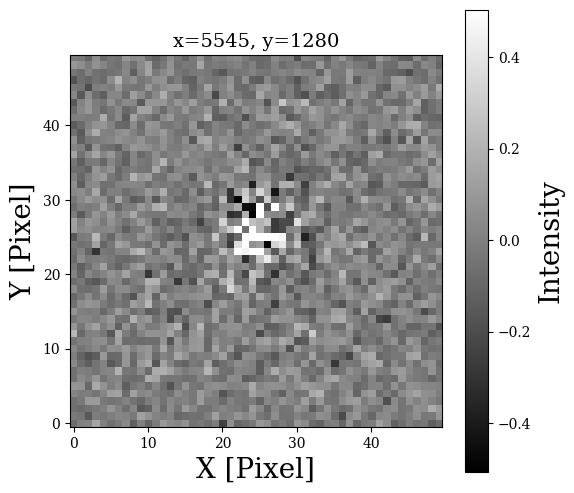

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20241101_013712_m650_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20241101_013712_m650_300.com.subt.fits 		-tile yes 		-pan to 5545.1655 1280.7513 physical 		-frame new 		-pan to 5545.1655 1280.7513 physical &


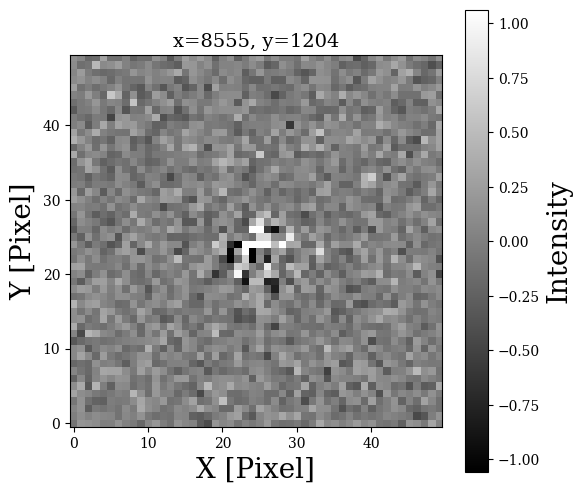

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20241113_011305_m650_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20241113_011305_m650_300.com.subt.fits 		-tile yes 		-pan to 8555.834 1204.9646 physical 		-frame new 		-pan to 8555.834 1204.9646 physical &


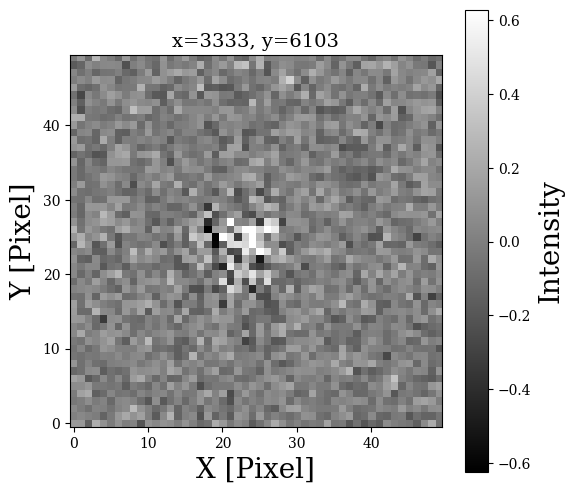

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20241209_021706_m650_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m650/calib_7DT07_T00215_20241209_021706_m650_300.com.subt.fits 		-tile yes 		-pan to 3333.1765 6103.7974 physical 		-frame new 		-pan to 3333.1765 6103.7974 physical &


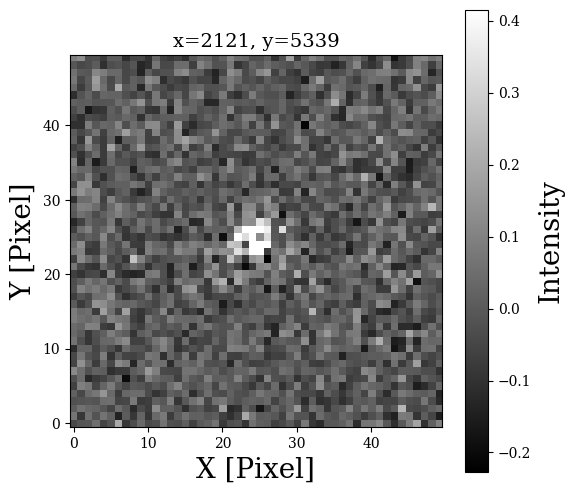

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241106_012445_m675_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241106_012445_m675_300.com.subt.fits 		-tile yes 		-pan to 2121.1902 5339.875 physical 		-frame new 		-pan to 2121.1902 5339.875 physical &


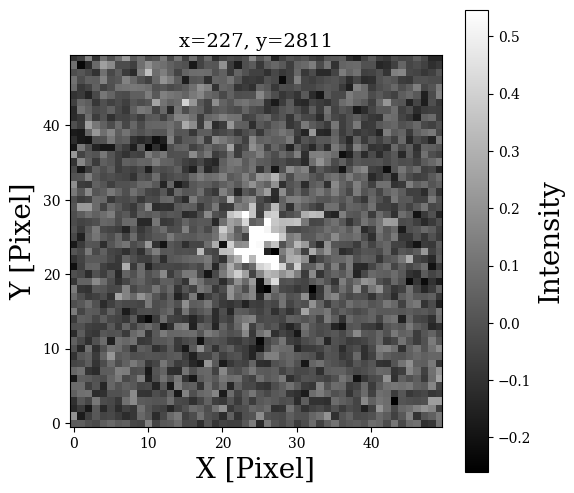

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241107_005923_m675_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241107_005923_m675_300.com.subt.fits 		-tile yes 		-pan to 227.8793 2811.0422 physical 		-frame new 		-pan to 227.8793 2811.0422 physical &


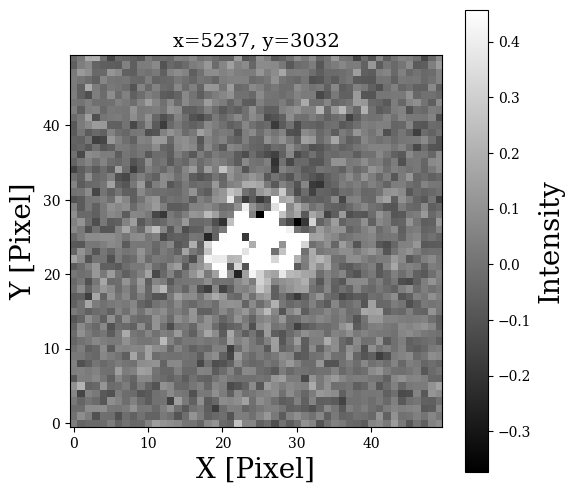

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241121_014257_m675_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241121_014257_m675_300.com.subt.fits 		-tile yes 		-pan to 5237.9395 3032.4404 physical 		-frame new 		-pan to 5237.9395 3032.4404 physical &


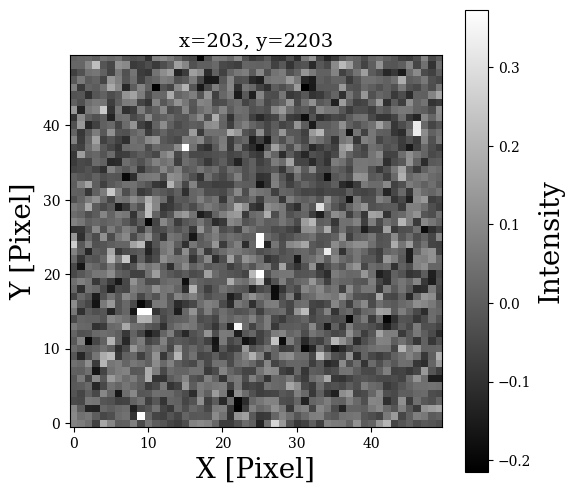

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241123_013331_m675_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241123_013331_m675_300.com.subt.fits 		-tile yes 		-pan to 203.9874 2203.9321 physical 		-frame new 		-pan to 203.9874 2203.9321 physical &


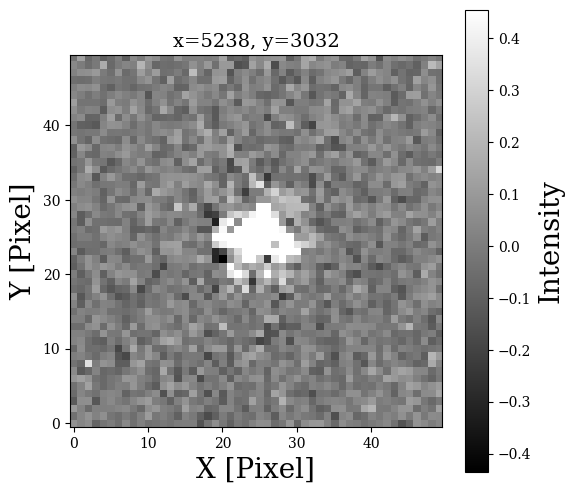

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241207_060425_m675_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241207_060425_m675_300.com.subt.fits 		-tile yes 		-pan to 5238.7168 3032.7209 physical 		-frame new 		-pan to 5238.7168 3032.7209 physical &


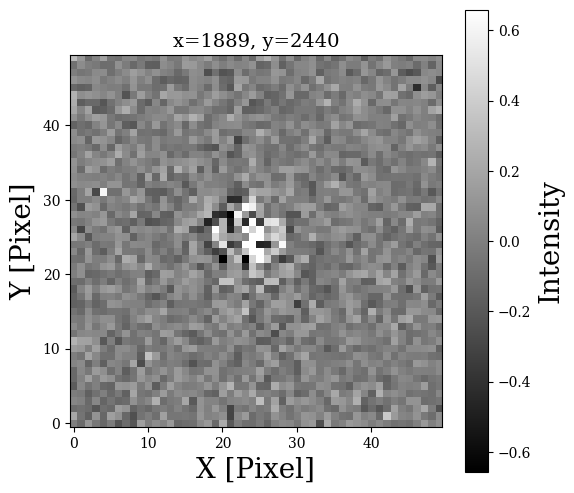

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241209_022407_m675_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT07/m675/calib_7DT07_T00215_20241209_022407_m675_300.com.subt.fits 		-tile yes 		-pan to 1889.4048 2440.6714 physical 		-frame new 		-pan to 1889.4048 2440.6714 physical &


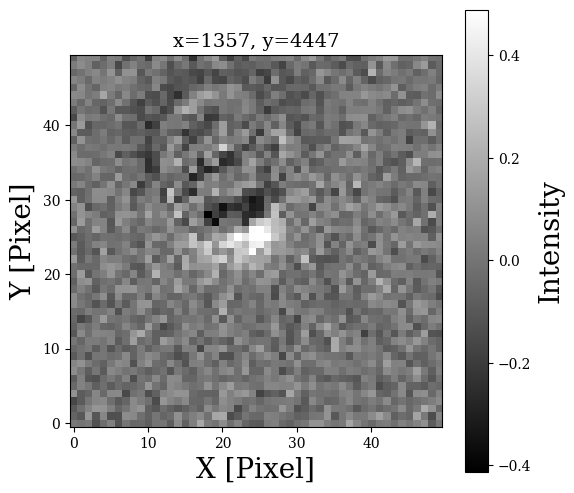

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241106_011915_m700_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241106_011915_m700_300.com.subt.fits 		-tile yes 		-pan to 1357.082 4447.5244 physical 		-frame new 		-pan to 1357.082 4447.5244 physical &


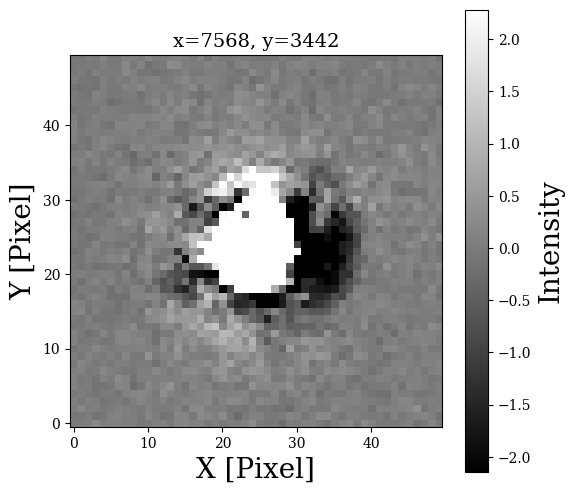

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241107_005348_m700_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241107_005348_m700_300.com.subt.fits 		-tile yes 		-pan to 7568.7705 3442.4463 physical 		-frame new 		-pan to 7568.7705 3442.4463 physical &


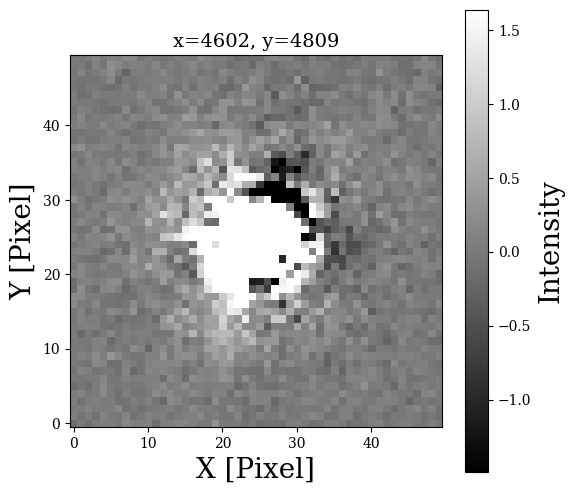

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241107_005348_m700_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241107_005348_m700_300.com.subt.fits 		-tile yes 		-pan to 4602.3804 4809.6963 physical 		-frame new 		-pan to 4602.3804 4809.6963 physical &


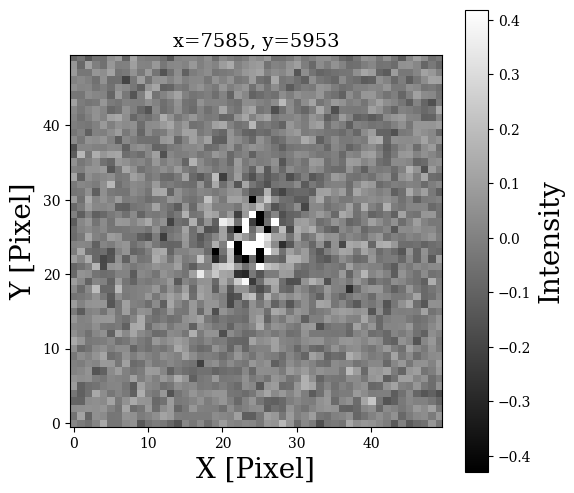

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241125_022631_m700_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241125_022631_m700_300.com.subt.fits 		-tile yes 		-pan to 7585.0718 5953.2002 physical 		-frame new 		-pan to 7585.0718 5953.2002 physical &


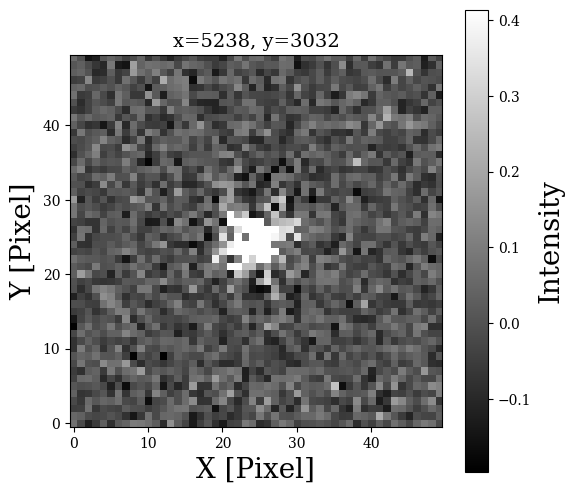

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241126_013123_m700_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241126_013123_m700_300.com.subt.fits 		-tile yes 		-pan to 5238.25 3032.5952 physical 		-frame new 		-pan to 5238.25 3032.5952 physical &


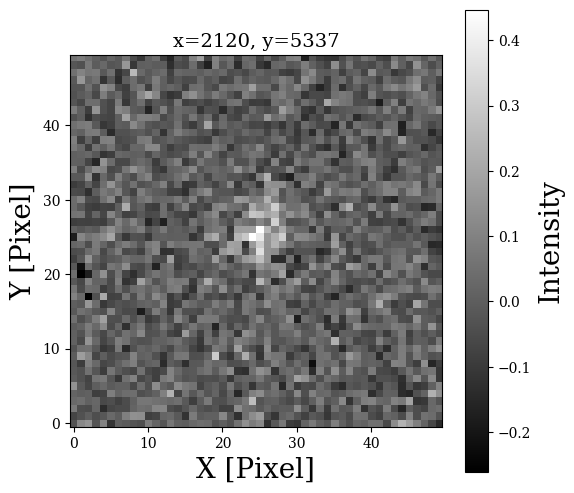

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241126_013123_m700_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241126_013123_m700_300.com.subt.fits 		-tile yes 		-pan to 2120.9617 5337.6919 physical 		-frame new 		-pan to 2120.9617 5337.6919 physical &


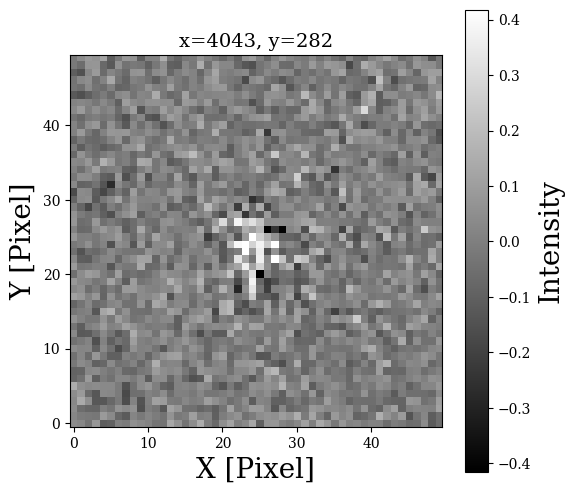

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241127_013337_m700_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m700/calib_7DT08_T00215_20241127_013337_m700_300.com.subt.fits 		-tile yes 		-pan to 4043.2368 282.0854 physical 		-frame new 		-pan to 4043.2368 282.0854 physical &


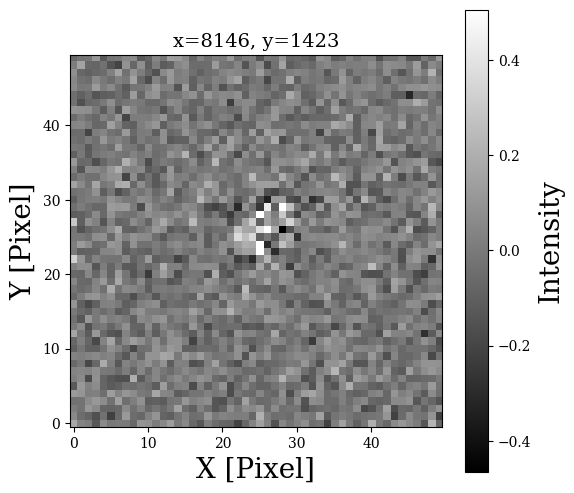

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241125_023200_m725_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241125_023200_m725_300.com.subt.fits 		-tile yes 		-pan to 8146.5664 1423.6781 physical 		-frame new 		-pan to 8146.5664 1423.6781 physical &


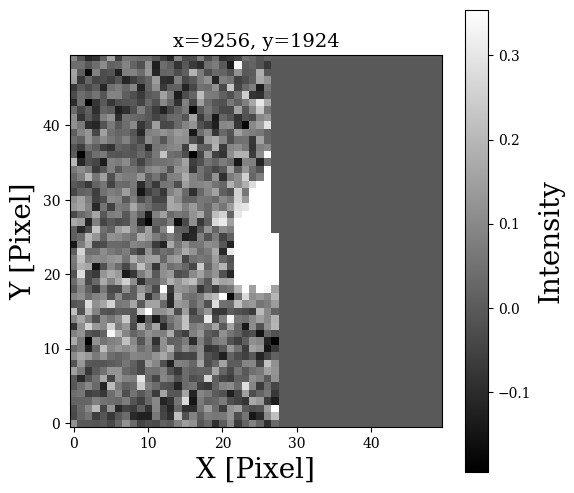

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241128_014010_m725_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241128_014010_m725_300.com.subt.fits 		-tile yes 		-pan to 9256.7959 1924.4216 physical 		-frame new 		-pan to 9256.7959 1924.4216 physical &


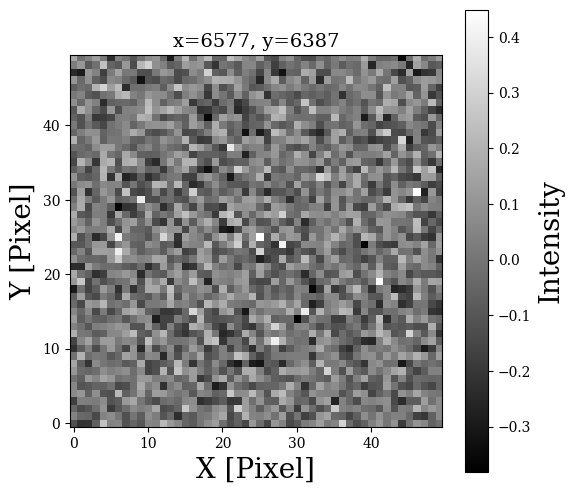

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241210_015018_m725_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241210_015018_m725_300.com.subt.fits 		-tile yes 		-pan to 6577.8145 6387.9961 physical 		-frame new 		-pan to 6577.8145 6387.9961 physical &


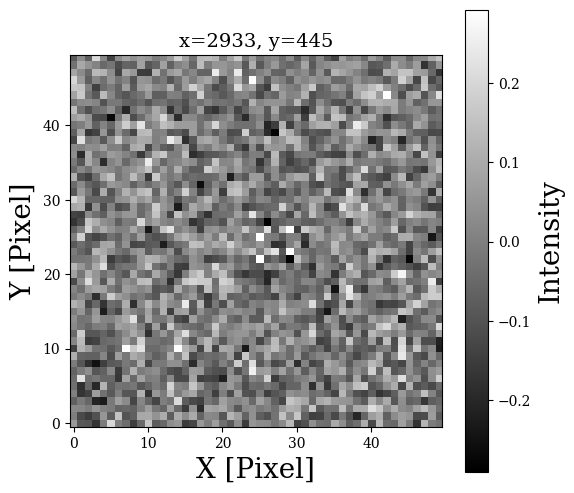

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241219_014518_m725_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT08/m725/calib_7DT08_T00215_20241219_014518_m725_300.com.subt.fits 		-tile yes 		-pan to 2933.9937 445.9823 physical 		-frame new 		-pan to 2933.9937 445.9823 physical &


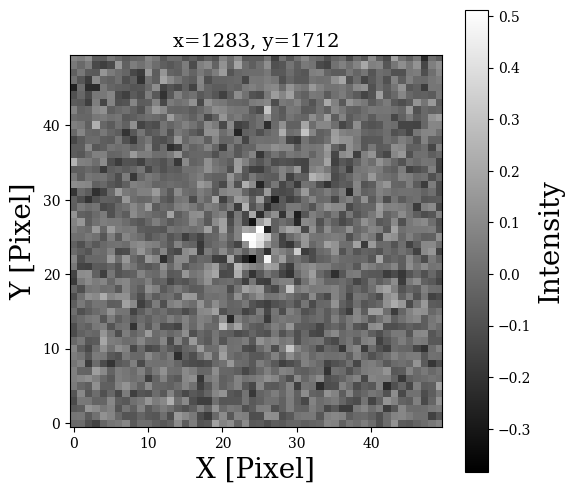

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20240907_082242_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20240907_082242_m750_300.com.subt.fits 		-tile yes 		-pan to 1283.2463 1712.9617 physical 		-frame new 		-pan to 1283.2463 1712.9617 physical &


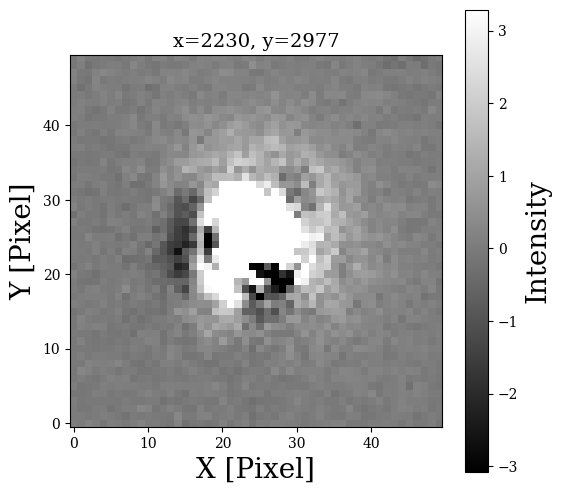

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20240907_082242_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20240907_082242_m750_300.com.subt.fits 		-tile yes 		-pan to 2230.5239 2977.9417 physical 		-frame new 		-pan to 2230.5239 2977.9417 physical &


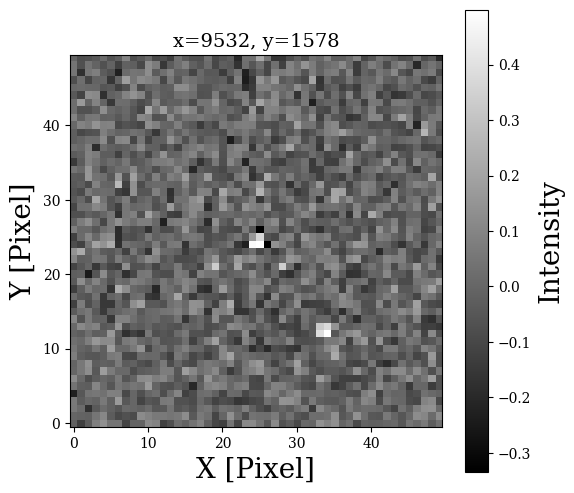

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241105_011453_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241105_011453_m750_300.com.subt.fits 		-tile yes 		-pan to 9532.75 1578.0394 physical 		-frame new 		-pan to 9532.75 1578.0394 physical &


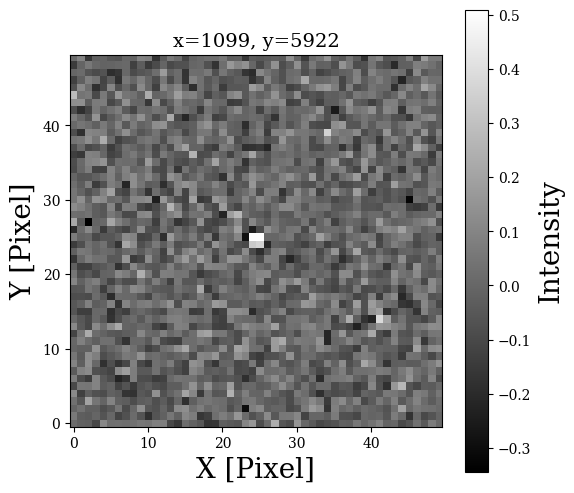

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241109_013048_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241109_013048_m750_300.com.subt.fits 		-tile yes 		-pan to 1099.62 5922.9136 physical 		-frame new 		-pan to 1099.62 5922.9136 physical &


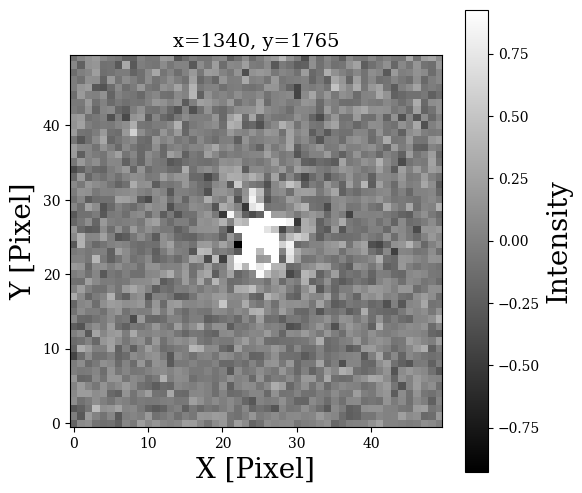

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241116_024901_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241116_024901_m750_300.com.subt.fits 		-tile yes 		-pan to 1340.7769 1765.6532 physical 		-frame new 		-pan to 1340.7769 1765.6532 physical &


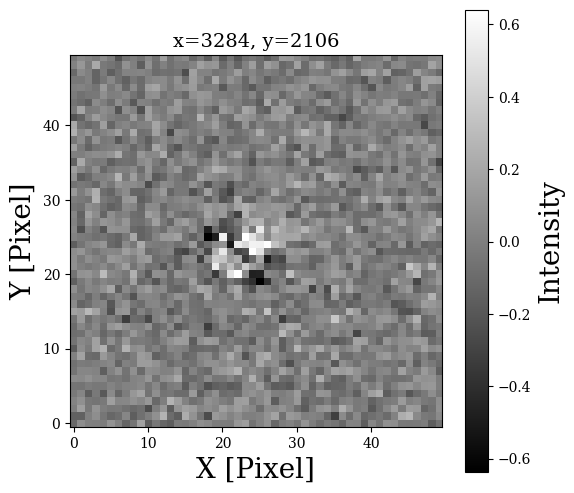

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241119_073857_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241119_073857_m750_300.com.subt.fits 		-tile yes 		-pan to 3284.3958 2106.2778 physical 		-frame new 		-pan to 3284.3958 2106.2778 physical &


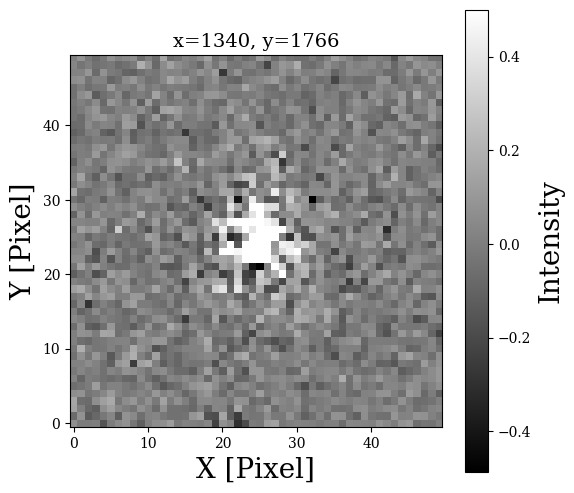

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241120_023737_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241120_023737_m750_300.com.subt.fits 		-tile yes 		-pan to 1340.7202 1766.3864 physical 		-frame new 		-pan to 1340.7202 1766.3864 physical &


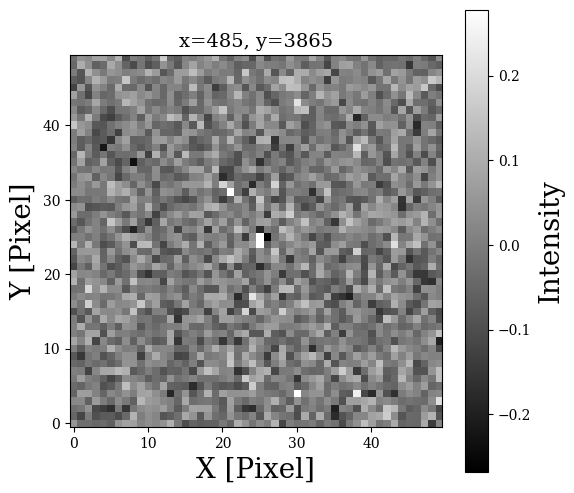

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241121_013731_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241121_013731_m750_300.com.subt.fits 		-tile yes 		-pan to 485.9484 3865.7708 physical 		-frame new 		-pan to 485.9484 3865.7708 physical &


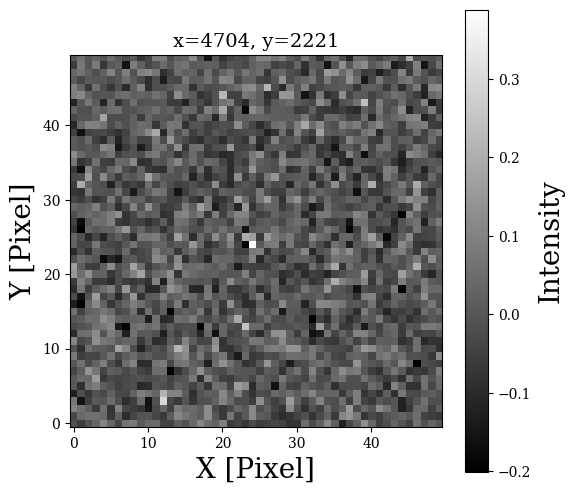

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241123_012804_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241123_012804_m750_300.com.subt.fits 		-tile yes 		-pan to 4704.104 2221.0786 physical 		-frame new 		-pan to 4704.104 2221.0786 physical &


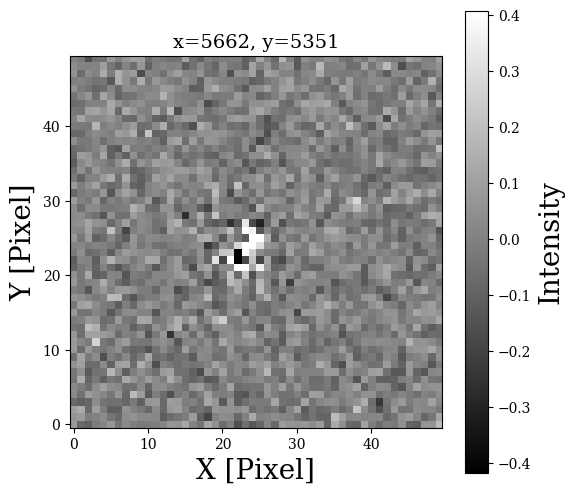

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241123_012804_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241123_012804_m750_300.com.subt.fits 		-tile yes 		-pan to 5662.0444 5351.3091 physical 		-frame new 		-pan to 5662.0444 5351.3091 physical &


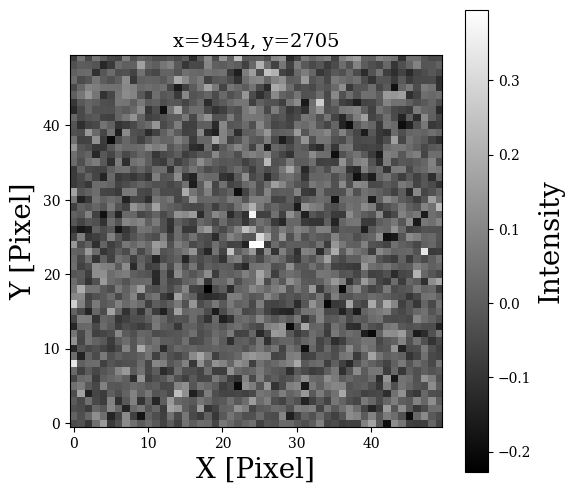

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241126_013131_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241126_013131_m750_300.com.subt.fits 		-tile yes 		-pan to 9454.9502 2705.2302 physical 		-frame new 		-pan to 9454.9502 2705.2302 physical &


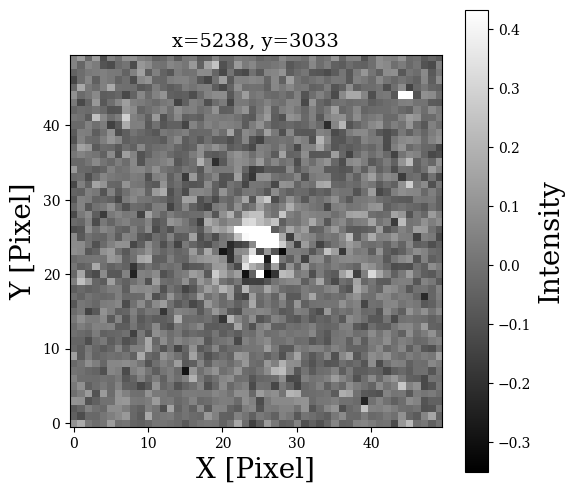

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241126_013131_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241126_013131_m750_300.com.subt.fits 		-tile yes 		-pan to 5238.7358 3033.8809 physical 		-frame new 		-pan to 5238.7358 3033.8809 physical &


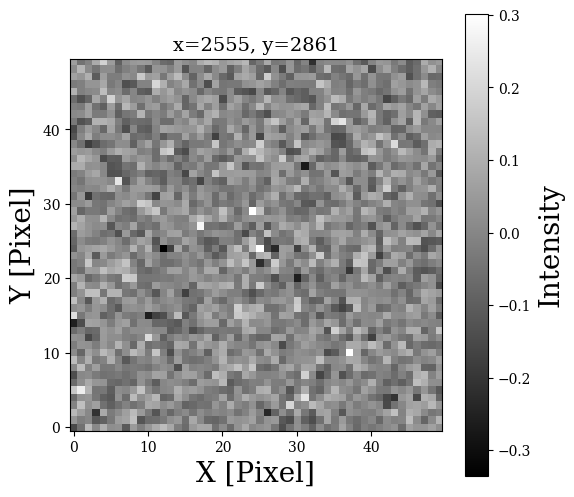

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241128_013450_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241128_013450_m750_300.com.subt.fits 		-tile yes 		-pan to 2555.7869 2861.0029 physical 		-frame new 		-pan to 2555.7869 2861.0029 physical &


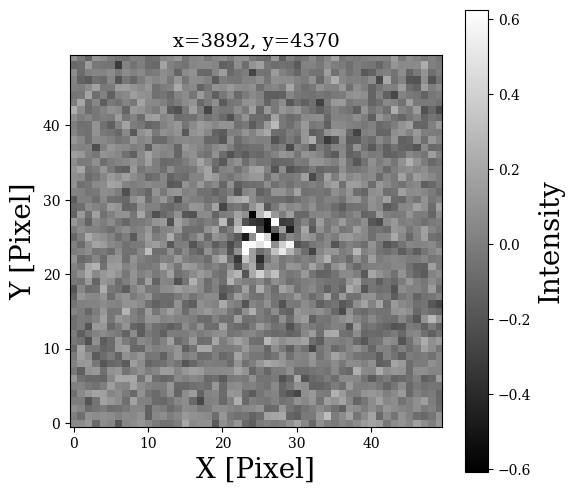

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241212_033202_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241212_033202_m750_300.com.subt.fits 		-tile yes 		-pan to 3892.4119 4370.4448 physical 		-frame new 		-pan to 3892.4119 4370.4448 physical &


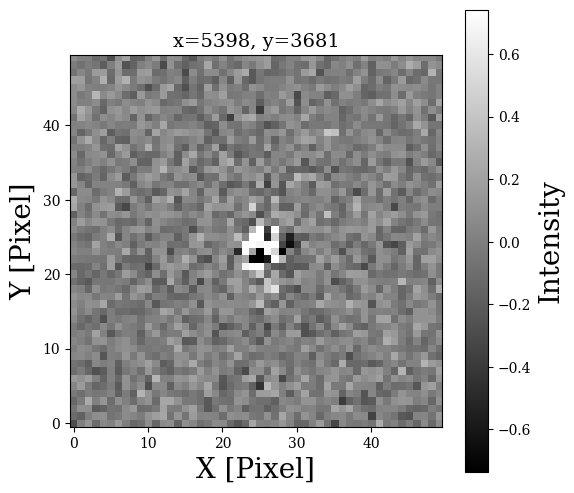

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241214_014921_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241214_014921_m750_300.com.subt.fits 		-tile yes 		-pan to 5398.1812 3681.6326 physical 		-frame new 		-pan to 5398.1812 3681.6326 physical &


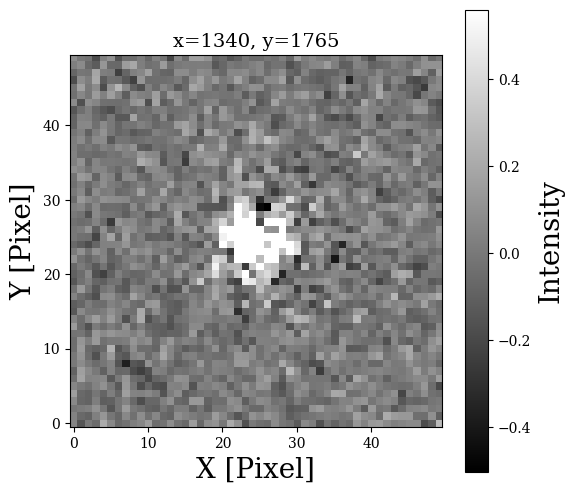

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241219_014001_m750_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m750/calib_7DT09_T00215_20241219_014001_m750_300.com.subt.fits 		-tile yes 		-pan to 1340.1937 1765.7023 physical 		-frame new 		-pan to 1340.1937 1765.7023 physical &


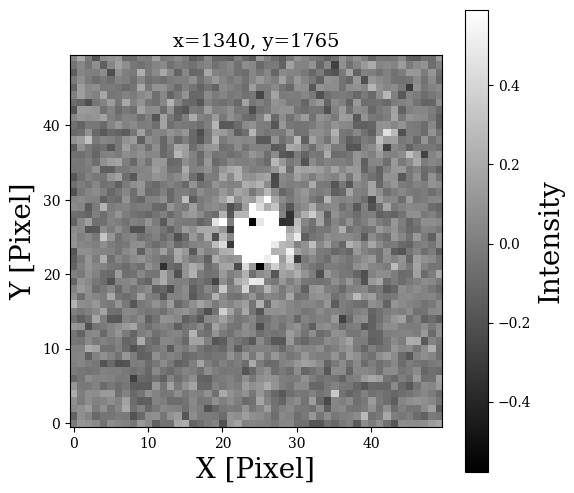

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241109_013757_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241109_013757_m775_300.com.subt.fits 		-tile yes 		-pan to 1340.619 1765.9827 physical 		-frame new 		-pan to 1340.619 1765.9827 physical &


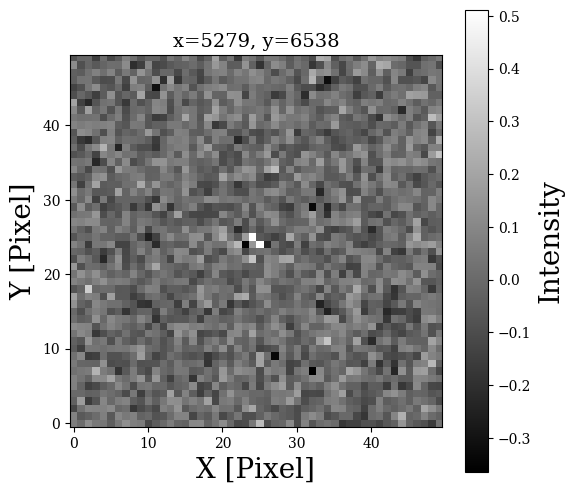

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241110_031814_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241110_031814_m775_300.com.subt.fits 		-tile yes 		-pan to 5279.0386 6538.9434 physical 		-frame new 		-pan to 5279.0386 6538.9434 physical &


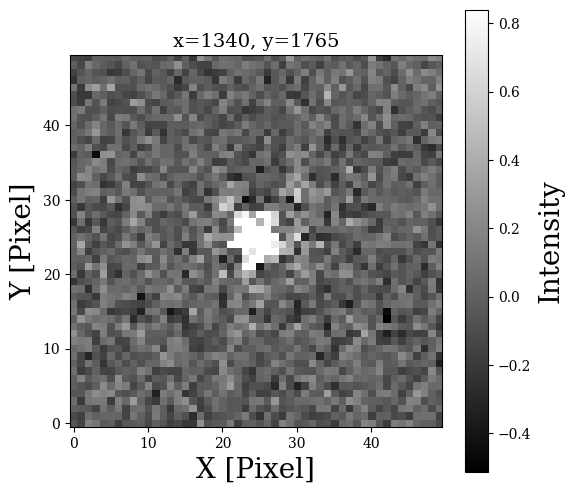

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241113_011837_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241113_011837_m775_300.com.subt.fits 		-tile yes 		-pan to 1340.4171 1765.9506 physical 		-frame new 		-pan to 1340.4171 1765.9506 physical &


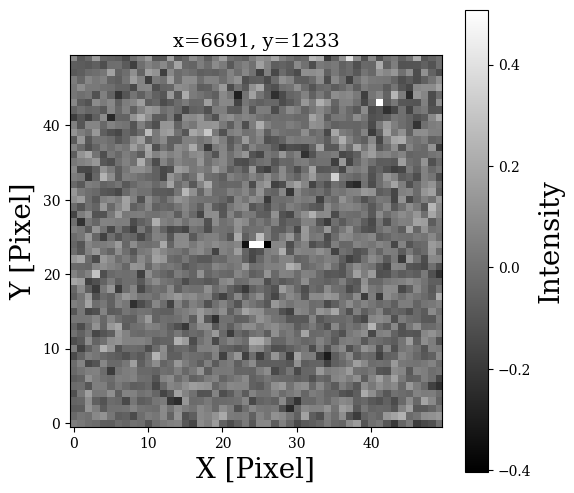

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241118_012802_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241118_012802_m775_300.com.subt.fits 		-tile yes 		-pan to 6691.8662 1233.1169 physical 		-frame new 		-pan to 6691.8662 1233.1169 physical &


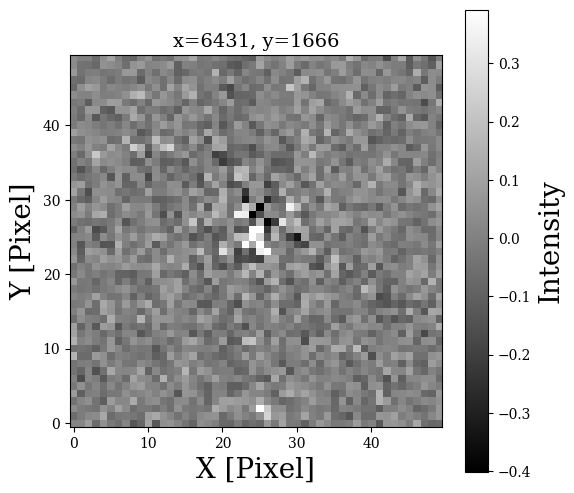

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241121_014301_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241121_014301_m775_300.com.subt.fits 		-tile yes 		-pan to 6431.3594 1666.8943 physical 		-frame new 		-pan to 6431.3594 1666.8943 physical &


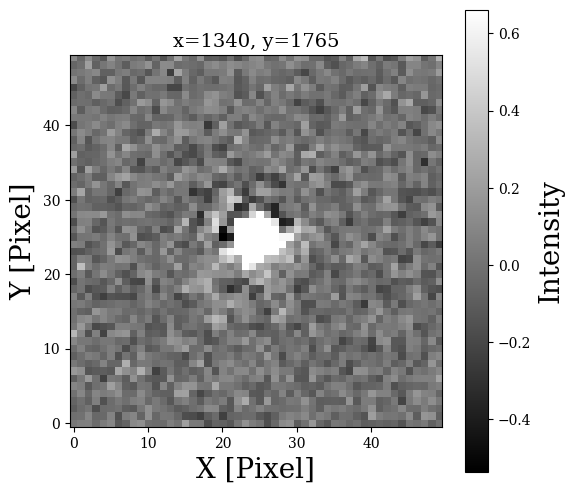

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241217_014434_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241217_014434_m775_300.com.subt.fits 		-tile yes 		-pan to 1340.5951 1765.6239 physical 		-frame new 		-pan to 1340.5951 1765.6239 physical &


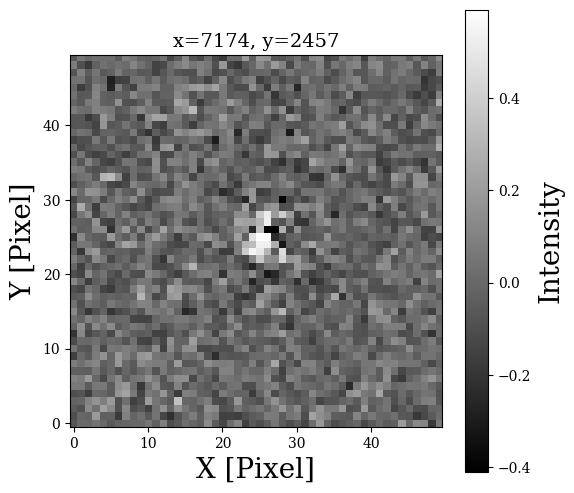

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241217_014434_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241217_014434_m775_300.com.subt.fits 		-tile yes 		-pan to 7174.9878 2457.155 physical 		-frame new 		-pan to 7174.9878 2457.155 physical &


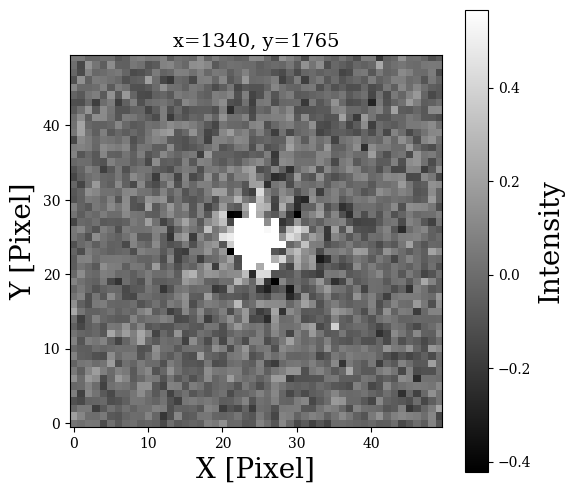

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241220_013409_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241220_013409_m775_300.com.subt.fits 		-tile yes 		-pan to 1340.403 1765.6259 physical 		-frame new 		-pan to 1340.403 1765.6259 physical &


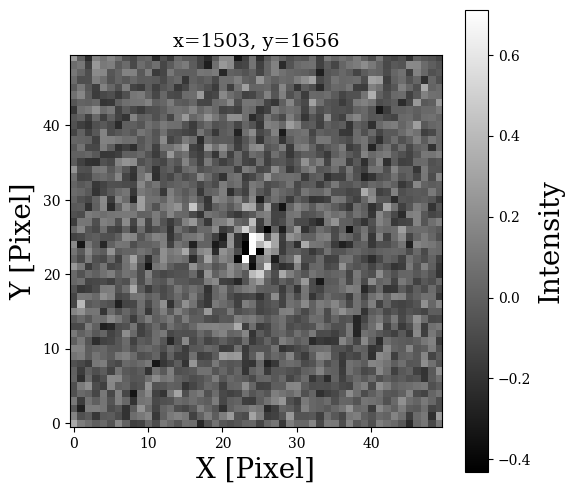

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241221_013445_m775_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT09/m775/calib_7DT09_T00215_20241221_013445_m775_300.com.subt.fits 		-tile yes 		-pan to 1503.5341 1656.4735 physical 		-frame new 		-pan to 1503.5341 1656.4735 physical &


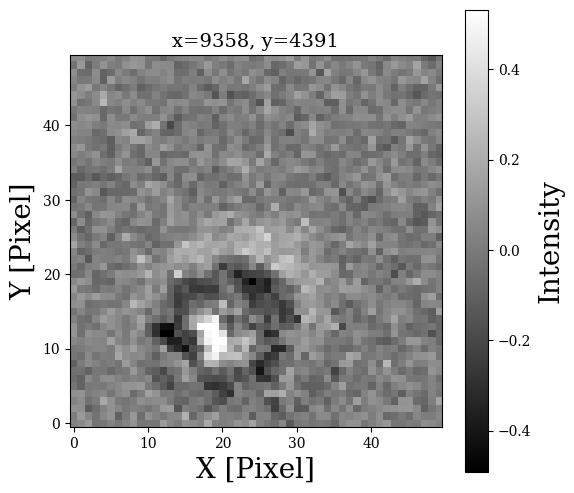

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241104_041550_m825_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241104_041550_m825_300.com.subt.fits 		-tile yes 		-pan to 9358.6826 4391.1084 physical 		-frame new 		-pan to 9358.6826 4391.1084 physical &


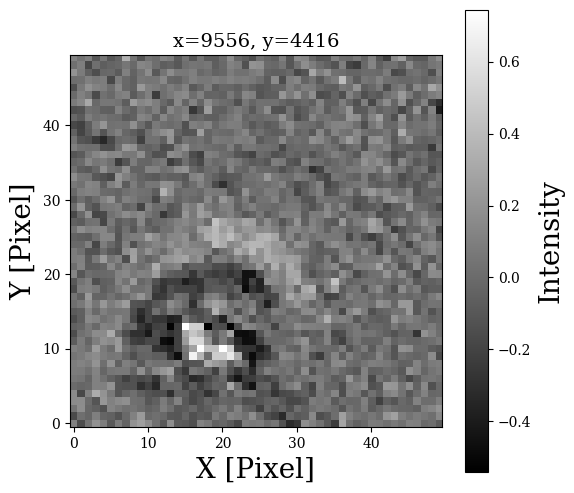

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241114_010634_m825_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241114_010634_m825_300.com.subt.fits 		-tile yes 		-pan to 9556.8193 4416.001 physical 		-frame new 		-pan to 9556.8193 4416.001 physical &


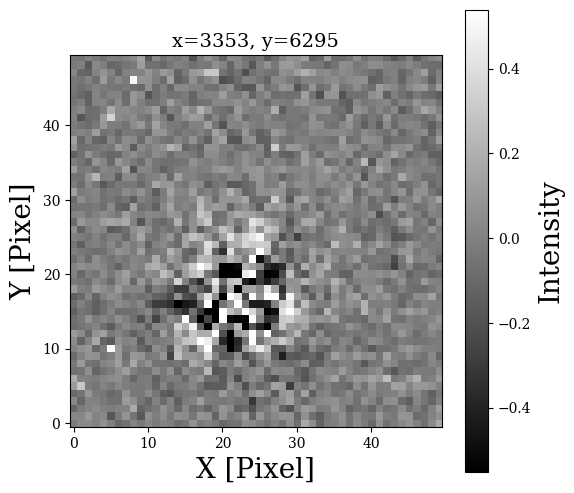

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241129_014020_m825_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241129_014020_m825_300.com.subt.fits 		-tile yes 		-pan to 3353.1606 6295.8638 physical 		-frame new 		-pan to 3353.1606 6295.8638 physical &


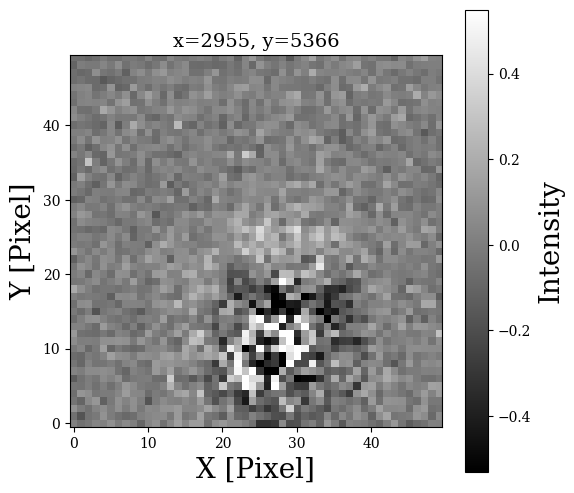

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241205_055312_m825_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT10/m825/calib_7DT10_T00215_20241205_055312_m825_300.com.subt.fits 		-tile yes 		-pan to 2955.7212 5366.7437 physical 		-frame new 		-pan to 2955.7212 5366.7437 physical &


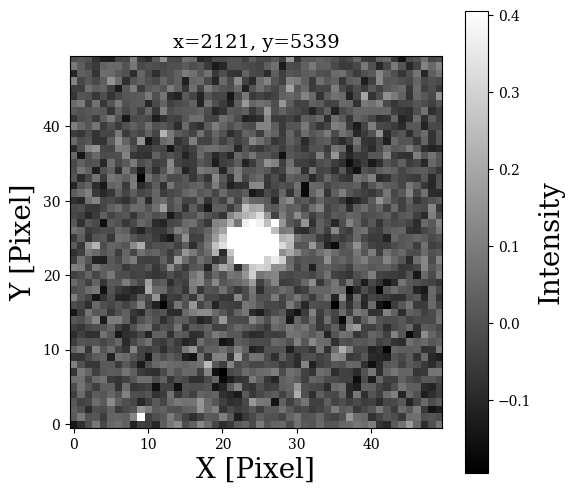

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241106_012447_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241106_012447_m425_300.com.subt.fits 		-tile yes 		-pan to 2121.1855 5339.4263 physical 		-frame new 		-pan to 2121.1855 5339.4263 physical &


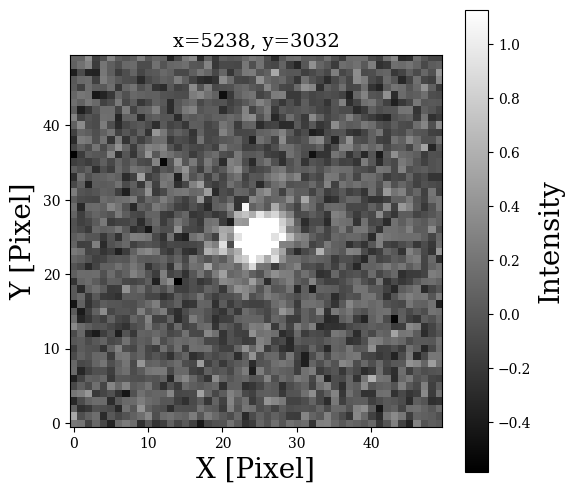

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241112_010429_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241112_010429_m425_300.com.subt.fits 		-tile yes 		-pan to 5238.6982 3032.8005 physical 		-frame new 		-pan to 5238.6982 3032.8005 physical &


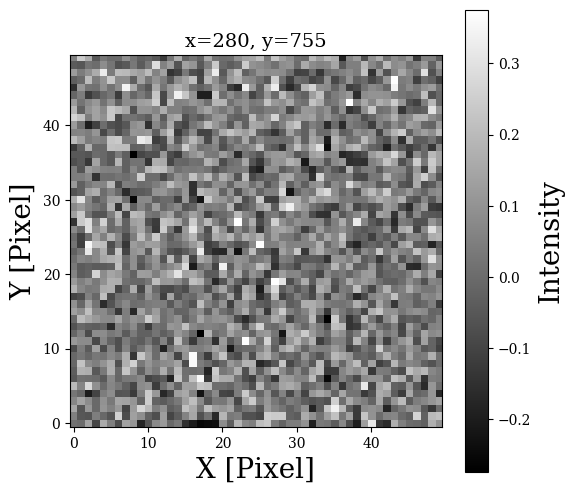

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241123_013329_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241123_013329_m425_300.com.subt.fits 		-tile yes 		-pan to 280.9539 755.0253 physical 		-frame new 		-pan to 280.9539 755.0253 physical &


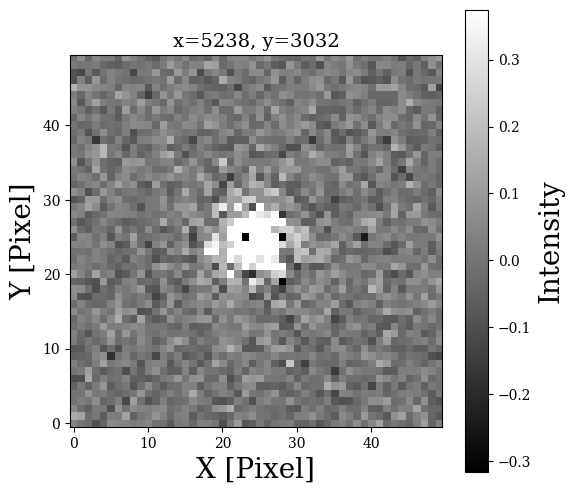

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241125_023205_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241125_023205_m425_300.com.subt.fits 		-tile yes 		-pan to 5238.3262 3032.5784 physical 		-frame new 		-pan to 5238.3262 3032.5784 physical &


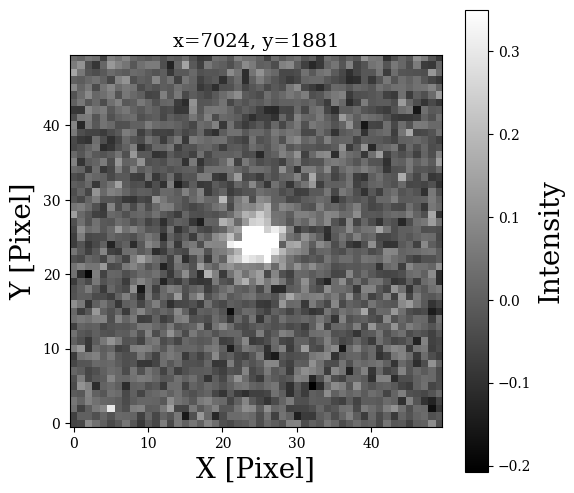

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241126_013657_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241126_013657_m425_300.com.subt.fits 		-tile yes 		-pan to 7024.6104 1881.3906 physical 		-frame new 		-pan to 7024.6104 1881.3906 physical &


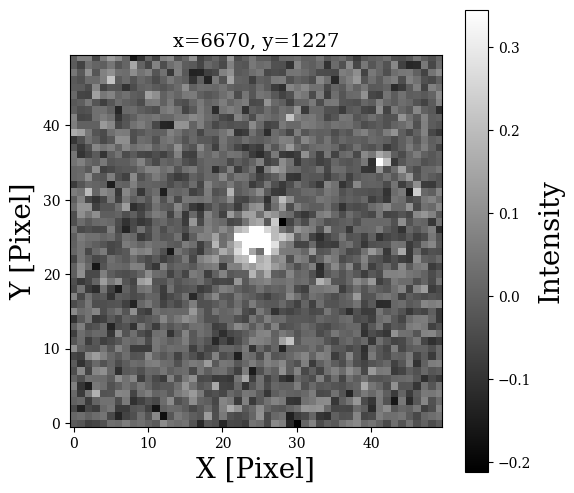

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241127_013911_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241127_013911_m425_300.com.subt.fits 		-tile yes 		-pan to 6670.4463 1227.1414 physical 		-frame new 		-pan to 6670.4463 1227.1414 physical &


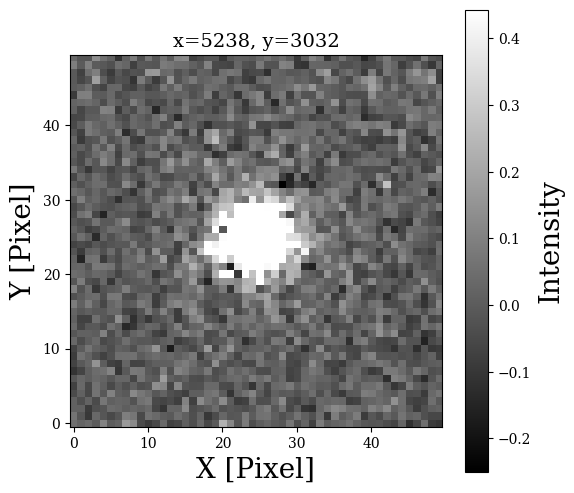

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241128_014016_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241128_014016_m425_300.com.subt.fits 		-tile yes 		-pan to 5238.3564 3032.7566 physical 		-frame new 		-pan to 5238.3564 3032.7566 physical &


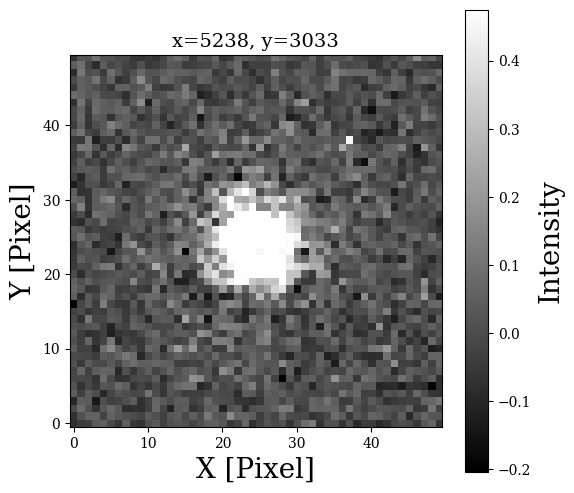

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241205_055239_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241205_055239_m425_300.com.subt.fits 		-tile yes 		-pan to 5238.4502 3033.2957 physical 		-frame new 		-pan to 5238.4502 3033.2957 physical &


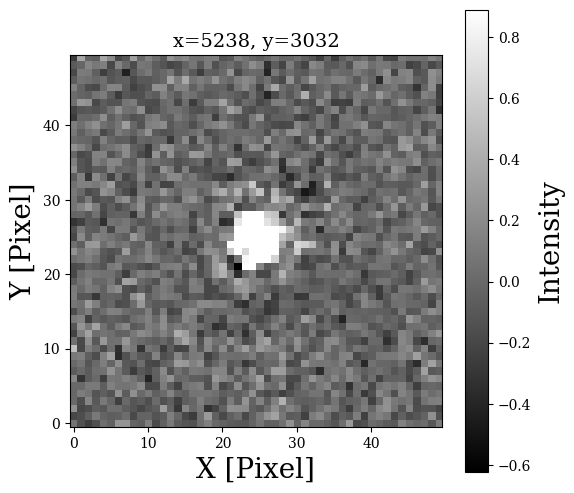

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241210_015027_m425_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m425/calib_7DT11_T00215_20241210_015027_m425_300.com.subt.fits 		-tile yes 		-pan to 5238.439 3032.7532 physical 		-frame new 		-pan to 5238.439 3032.7532 physical &


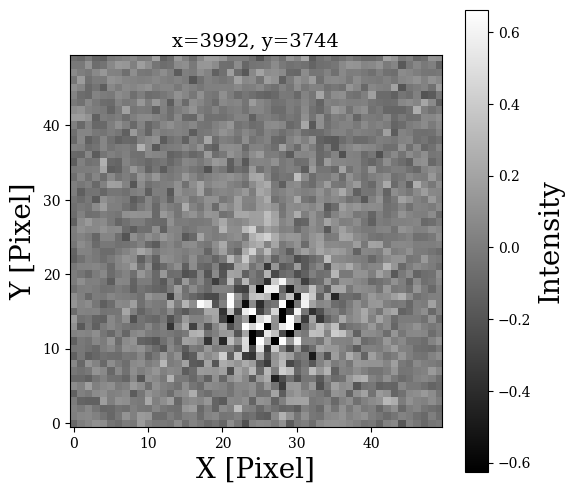

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20240907_082242_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20240907_082242_m850_300.com.subt.fits 		-tile yes 		-pan to 3992.689 3744.6833 physical 		-frame new 		-pan to 3992.689 3744.6833 physical &


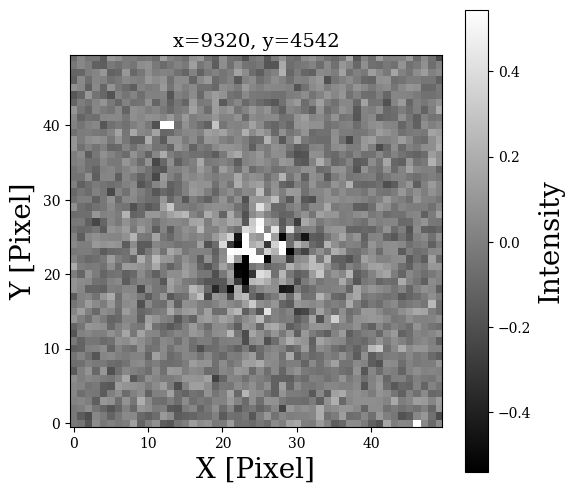

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241102_044738_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241102_044738_m850_300.com.subt.fits 		-tile yes 		-pan to 9320.1426 4542.2759 physical 		-frame new 		-pan to 9320.1426 4542.2759 physical &


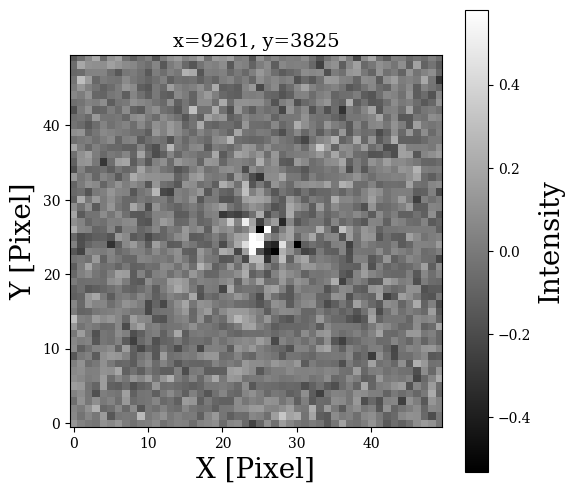

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241113_011306_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241113_011306_m850_300.com.subt.fits 		-tile yes 		-pan to 9261.0176 3825.2712 physical 		-frame new 		-pan to 9261.0176 3825.2712 physical &


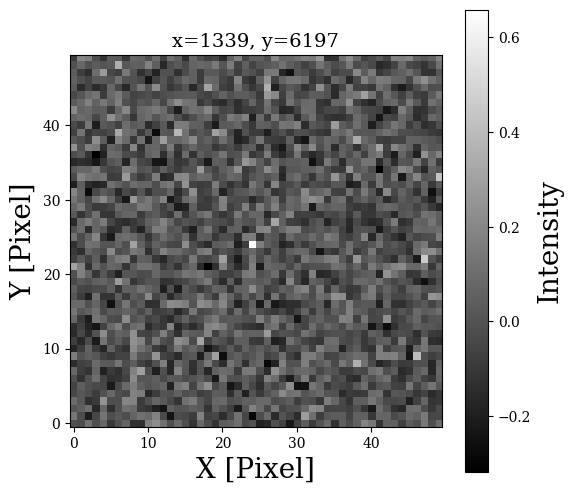

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241114_005901_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241114_005901_m850_300.com.subt.fits 		-tile yes 		-pan to 1339.0308 6197.001 physical 		-frame new 		-pan to 1339.0308 6197.001 physical &


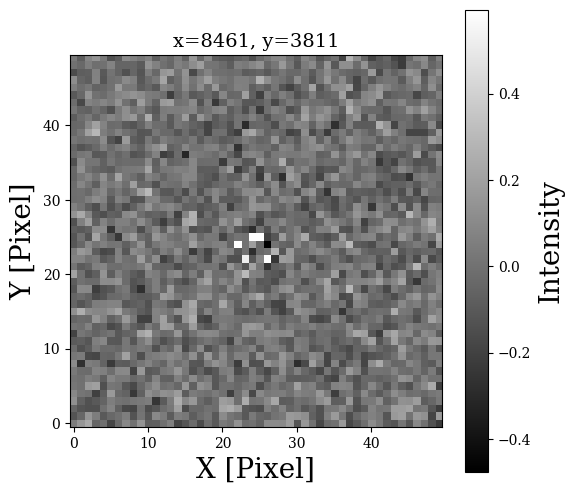

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241116_024900_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241116_024900_m850_300.com.subt.fits 		-tile yes 		-pan to 8461.0205 3811.9697 physical 		-frame new 		-pan to 8461.0205 3811.9697 physical &


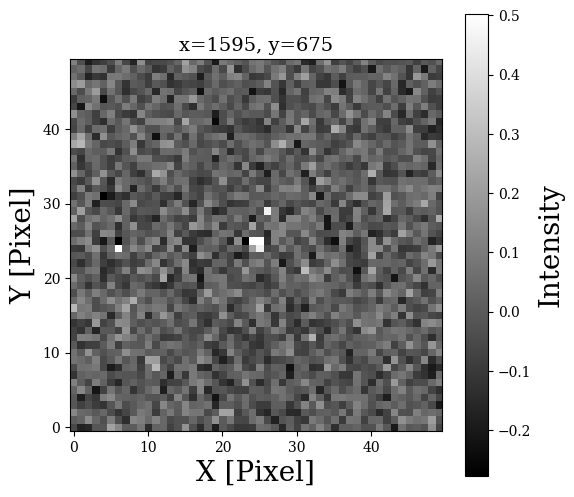

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241126_013129_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT11/m850/calib_7DT11_T00215_20241126_013129_m850_300.com.subt.fits 		-tile yes 		-pan to 1595.2708 675.9302 physical 		-frame new 		-pan to 1595.2708 675.9302 physical &


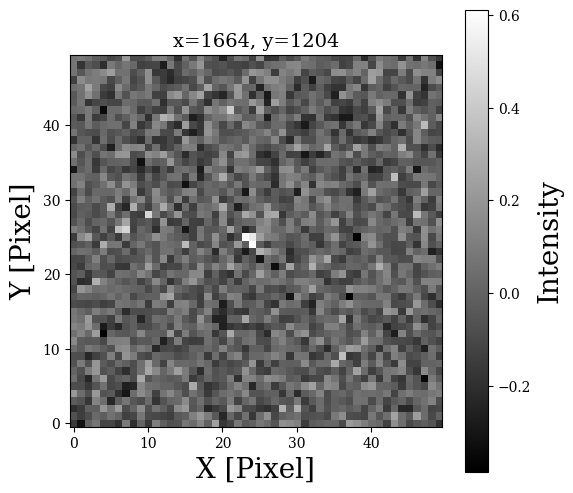

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241116_024857_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241116_024857_m850_300.com.subt.fits 		-tile yes 		-pan to 1664.0585 1204.1644 physical 		-frame new 		-pan to 1664.0585 1204.1644 physical &


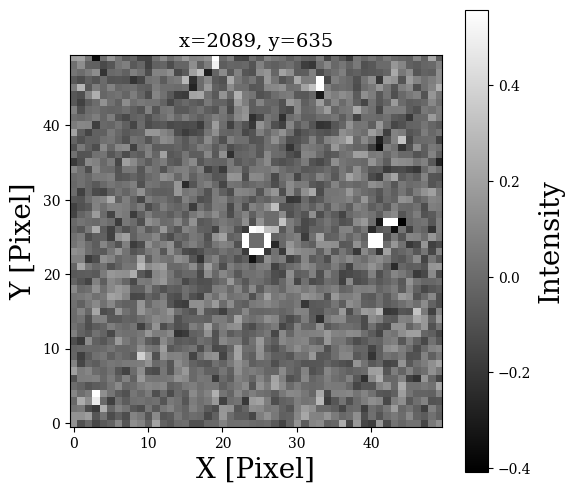

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241209_021705_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241209_021705_m850_300.com.subt.fits 		-tile yes 		-pan to 2089.8257 635.6086 physical 		-frame new 		-pan to 2089.8257 635.6086 physical &


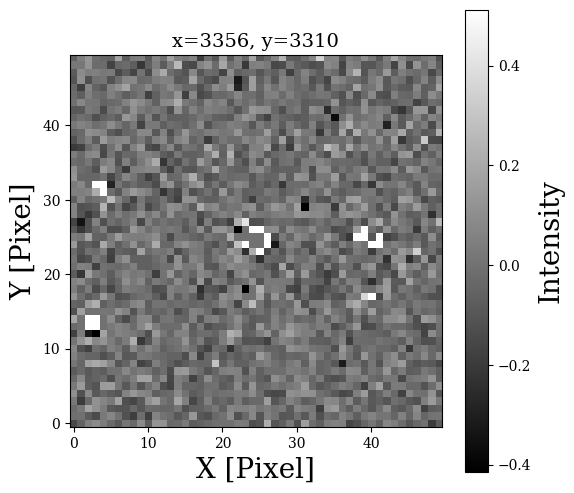

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241209_021705_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241209_021705_m850_300.com.subt.fits 		-tile yes 		-pan to 3356.8486 3310.2 physical 		-frame new 		-pan to 3356.8486 3310.2 physical &


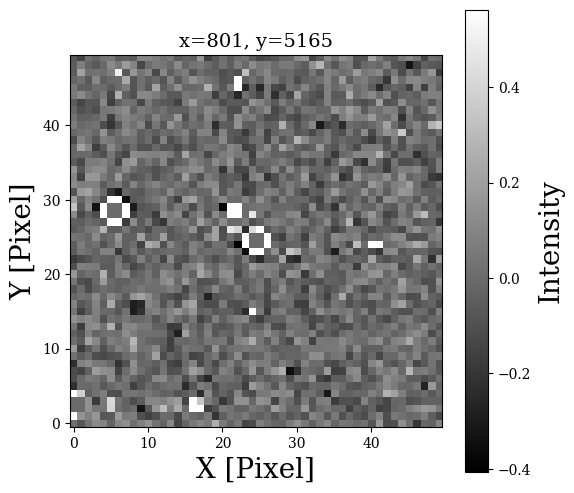

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241209_021705_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241209_021705_m850_300.com.subt.fits 		-tile yes 		-pan to 801.8178 5165.1182 physical 		-frame new 		-pan to 801.8178 5165.1182 physical &


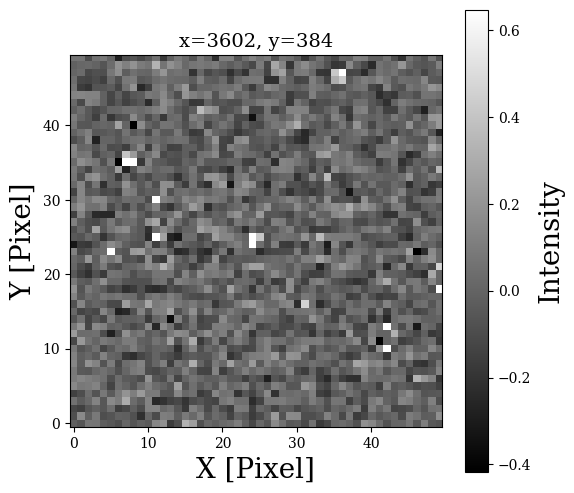

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 3602.0762 384.8666 physical 		-frame new 		-pan to 3602.0762 384.8666 physical &


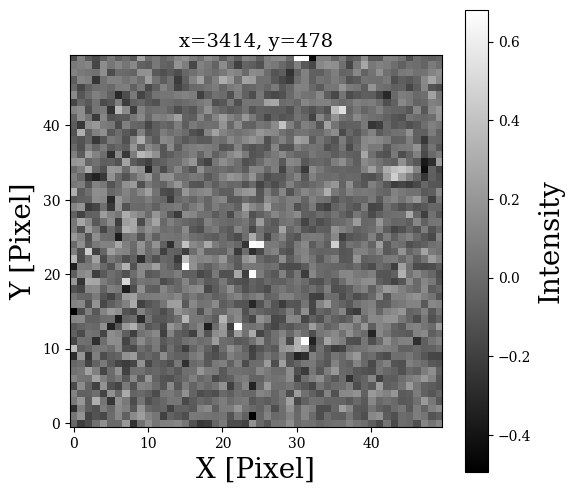

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 3414.2119 478.0389 physical 		-frame new 		-pan to 3414.2119 478.0389 physical &


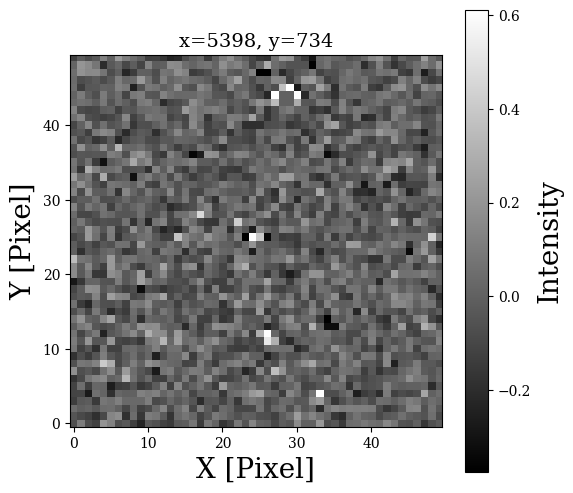

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 5398.2056 734.9815 physical 		-frame new 		-pan to 5398.2056 734.9815 physical &


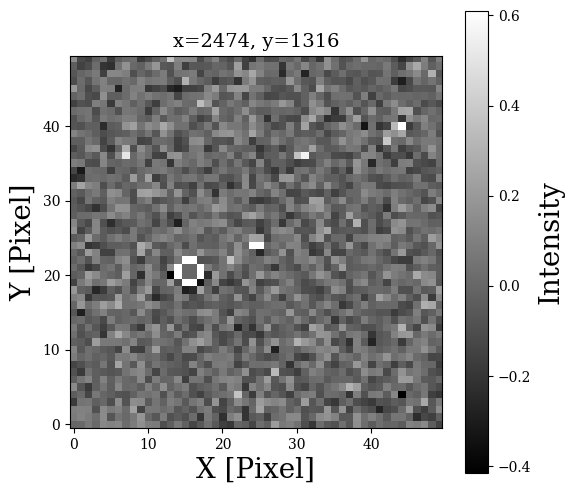

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 2474.4792 1316.0541 physical 		-frame new 		-pan to 2474.4792 1316.0541 physical &


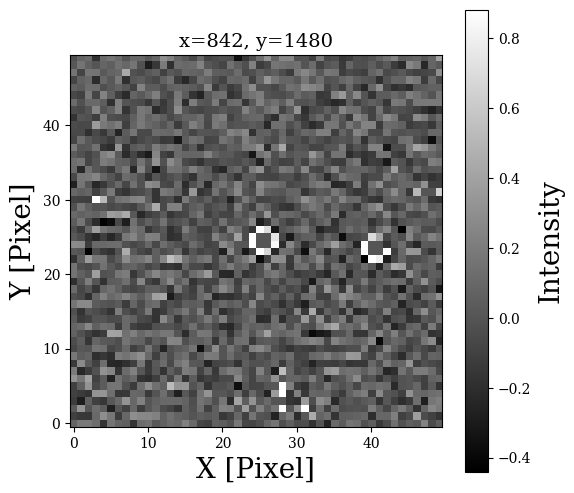

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 842.9821 1480.6438 physical 		-frame new 		-pan to 842.9821 1480.6438 physical &


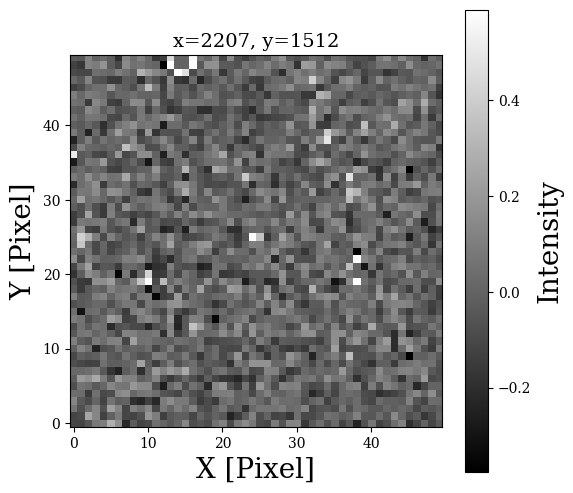

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 2207.1372 1512.9026 physical 		-frame new 		-pan to 2207.1372 1512.9026 physical &


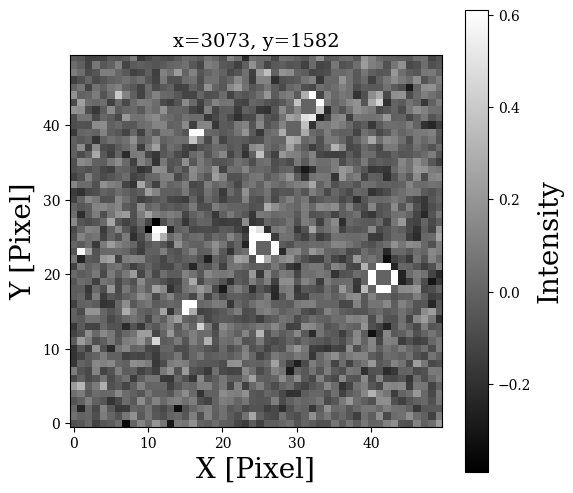

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 3073.6873 1582.7954 physical 		-frame new 		-pan to 3073.6873 1582.7954 physical &


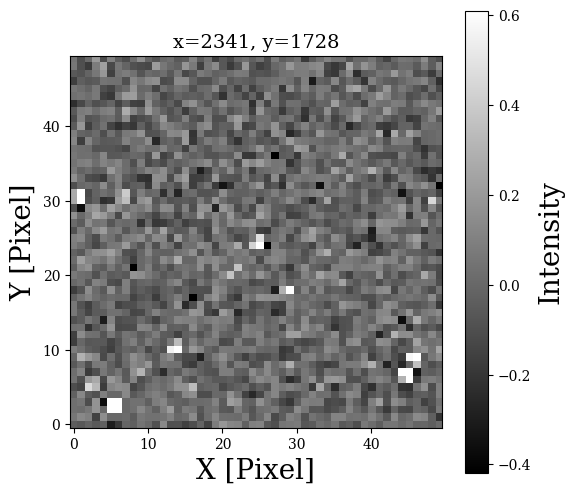

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 2341.8379 1728.1357 physical 		-frame new 		-pan to 2341.8379 1728.1357 physical &


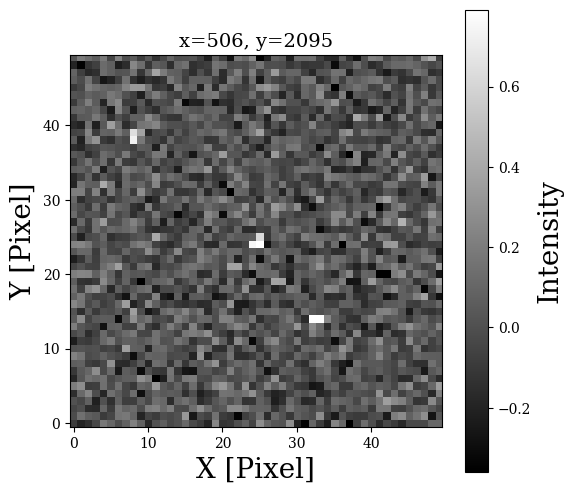

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 506.7645 2095.0469 physical 		-frame new 		-pan to 506.7645 2095.0469 physical &


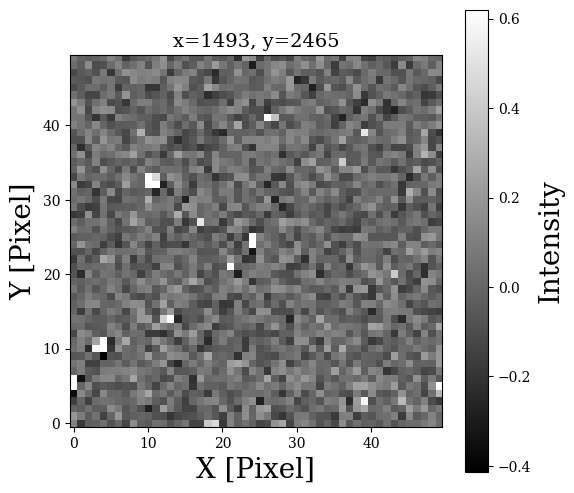

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 1493.0924 2465.1226 physical 		-frame new 		-pan to 1493.0924 2465.1226 physical &


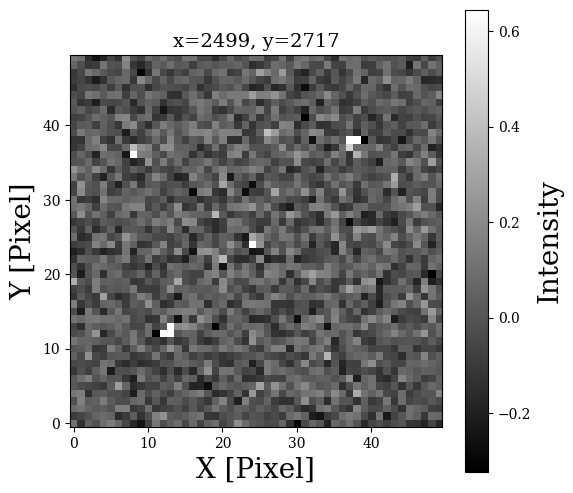

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 2499.1331 2717.1455 physical 		-frame new 		-pan to 2499.1331 2717.1455 physical &


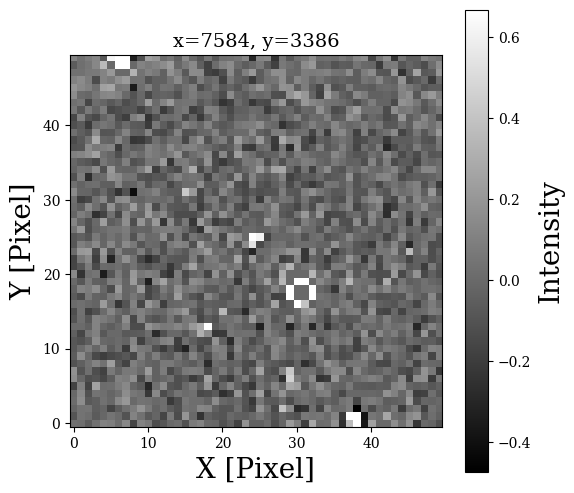

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 7584.0898 3386.9038 physical 		-frame new 		-pan to 7584.0898 3386.9038 physical &


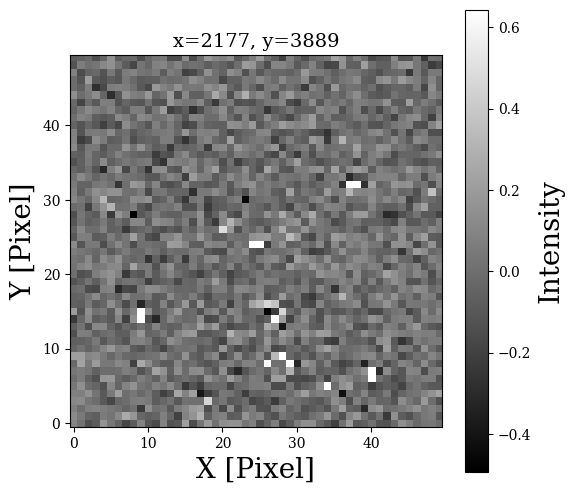

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 2177.1384 3889.1304 physical 		-frame new 		-pan to 2177.1384 3889.1304 physical &


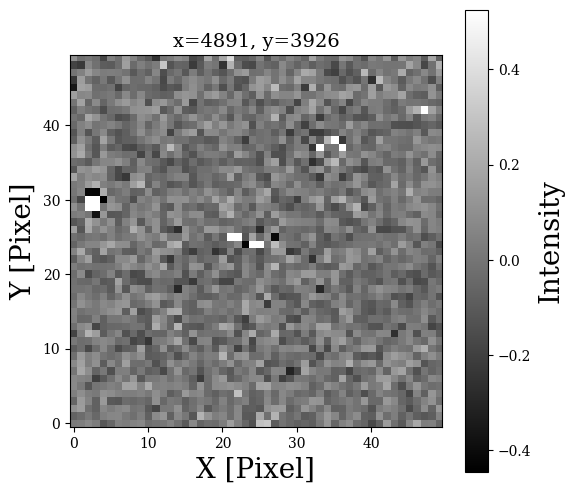

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 4891.5259 3926.0183 physical 		-frame new 		-pan to 4891.5259 3926.0183 physical &


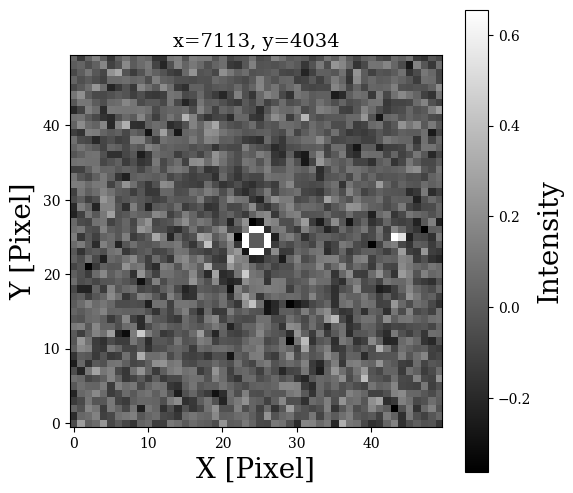

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 7113.3232 4034.6194 physical 		-frame new 		-pan to 7113.3232 4034.6194 physical &


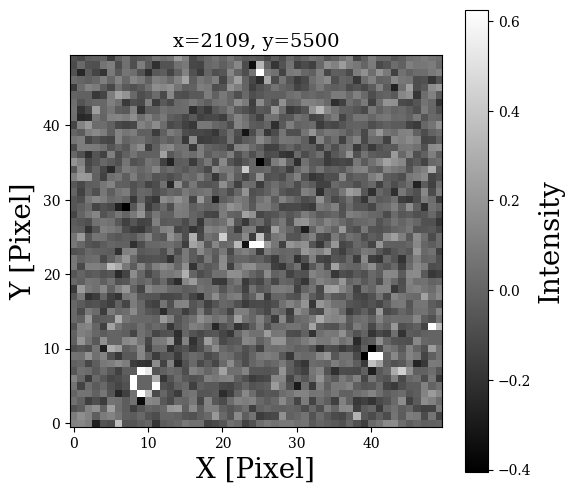

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 2109.5176 5500.022 physical 		-frame new 		-pan to 2109.5176 5500.022 physical &


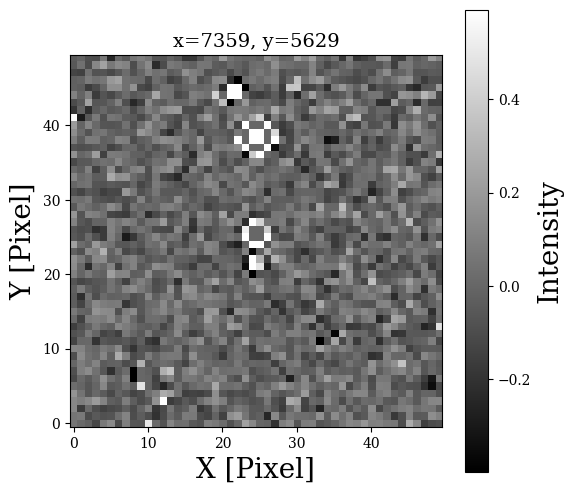

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241210_014455_m850_300.com.subt.fits 		-tile yes 		-pan to 7359.0361 5629.8477 physical 		-frame new 		-pan to 7359.0361 5629.8477 physical &


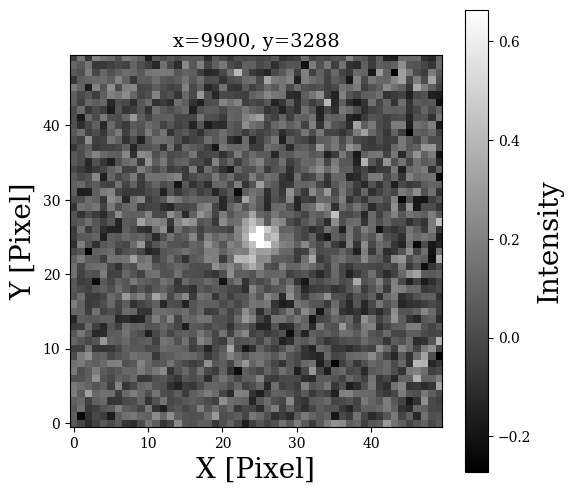

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241212_014632_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241212_014632_m850_300.com.subt.fits 		-tile yes 		-pan to 9900.6777 3288.6155 physical 		-frame new 		-pan to 9900.6777 3288.6155 physical &


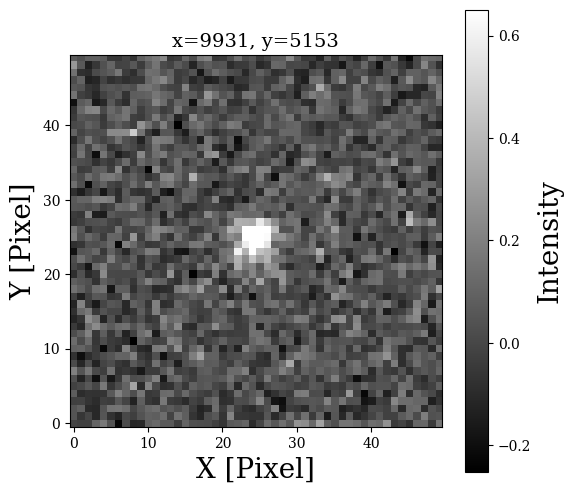

ds9 /lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241212_014632_m850_300.com.fits 		/lyman/data1/processed_1x1_gain2750/T00215/7DT12/m850/calib_7DT12_T00215_20241212_014632_m850_300.com.subt.fits 		-tile yes 		-pan to 9931.2773 5153.7432 physical 		-frame new 		-pan to 9931.2773 5153.7432 physical &


In [41]:
# # for nn, (image, x, y) in enumerate(zip(cand_table['image'], cand_table['X_IMAGE'], cand_table['Y_IMAGE'])):
# for nn, (image, x, y) in enumerate(zip(significant_table['image'], significant_table['X_IMAGE'], significant_table['Y_IMAGE'])):
# 	sci_image = image.replace(".subt", "")
# 	visualize_fits_region(x, y, image, size=50)

# 	# ds9com = f"ds9 {sci_image} {image} &"

# 	ds9com = f"""ds9 {sci_image} \
# 		{image} \
# 		-tile yes \
# 		-pan to {x} {y} physical \
# 		-frame new \
# 		-pan to {x} {y} physical &"""
# 	print(ds9com)
# 	if nn == 100:
# 		break

In [22]:
# data = fits.getdata("/lyman/data1/processed_1x1_gain2750/T00138/7DT07/m675/calib_7DT07_T00138_20241103_011813_m675_300.com.subt.fits")
# subdata = data[5136-20:5136+20,2717-20:2717+20]
# # plt.imshow(subdata)
# _ = plt.hist(subdata.flatten(), bins=100)